# CAP 6619 - Deep Learning - Dr. Marques - Summer 2022

# Project 3: Machine Learning
## Authors: Jennifer Gogova, Peter Worth and Austin LeBlanc (Parts 1, 2 and 3 respectively)

### Goals 

- To learn how to implement a Data Science / Machine Learning workflow in Python (using Pandas, Scikit-learn, Matplotlib, and Numpy)
- To learn how to use perform linear regression by least squares using Python and scikit-learn.
- To appreciate that the same linear regression coefficients may be the best fit for dramatically different data distributions -- as illustrated by the Anscombe's quartet.
- To practice with different types of regularization (*lasso* and *ridge*) and understand when to use them.
- To learn how to implement several different machine learning classification models in Python 
- To learn how to evaluate and fine-tune the performance of a model using cross-validation
- To learn how to test a model and produce a set of plots and performance measures
- To expand upon the prior experience of manipulating, summarizing, and visualizing representative datasets  in data science and machine learning

### Instructions

- This assignment is structured in 3 parts, each using their own dataset(s).
- As usual, there will be some Python code to be written and questions to be answered.
- At the end, you should export your notebook to PDF format; it will "automagically" become your report.
- Submit the report (PDF), notebook (.ipynb file), and the link to the "live" version of your solution on Google Colaboratory via Canvas.
- **The number of points is indicated next to each part. They add up to 100.**
- **There are additional (10 points worth of) bonus items**, which are, of course optional. 

### Important

- For the sake of reproducibility, use `random_state=0` (or equivalent) in all functions that use random number generation.
- It is OK to attempt the bonus points, but please **do not overdo it!** 


---------
### Imports + Google Drive

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     / 21.8 MB 142 kB/s
     |████████████████████████████████| 596 kB 5.3 MB/s 
     |████████████████████████████████| 102 kB 49.3 MB/s 
     |████████████████████████████████| 690 kB 4.0 MB/s 
     |████████████████████████████████| 4.7 MB 35.2 MB/s 
     |████████████████████████████████| 62 kB 1.3 MB/s 
     |████████████████████████████████| 812 kB 33.7 MB/s 
     |████████████████████████████████| 38.1 MB 4.1 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=262599 sha256=751d6eabff5be204cb57a6496df2d1d320124e7f7cf6264b98c84aa5e1988616
  Stored in directory: /tmp/pip-ephem-wheel-cache-77jw5hlt/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=0f305306b8309bed0fd44e27743fe079df05495d7f86ae3e237959deefd36232
  Stored in directory

In [ ]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
import seaborn as sns; sns.set()
import scipy.stats as ss
from pandas_profiling import ProfileReport

from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
# Set seed for RNG (to ensure reproducibility of results)
np.random.seed(42)

## Part 1: Regression Analysis


-----------
### 1a. Linear regression by least squares

In this part, we will look at the correlation between female literacy and fertility (defined as the average number of children born per woman) throughout the world. For ease of analysis and interpretation, we will work with the *illiteracy* rate.

The Python code below plots the fertility versus illiteracy and computes the Pearson correlation coefficient. The Numpy array `illiteracy` has the illiteracy rate among females for most of the world's nations. The array `fertility` has the corresponding fertility data.

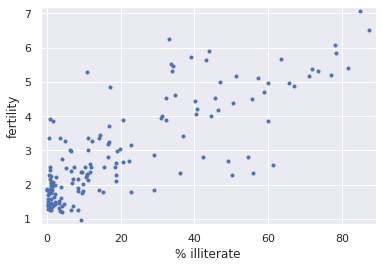

Pearson correlation coefficient between illiteracy and fertility: 0.80413


In [ ]:
df = pd.read_csv('https://github.com/ogemarques/data-files/raw/main/female_literacy_fertility.csv') 
illiteracy = 100 - df['female literacy']
fertility = df['fertility']

def pearson_r(x, y):
    """Compute Pearson correlation coefficient between two arrays."""
    # Compute correlation matrix: corr_mat
    corr_mat = np.corrcoef(x, y)

    # Return entry [0,1]
    return corr_mat[0,1]

# Plot the illiteracy rate versus fertility
_ = plt.plot(illiteracy, fertility, marker='.', linestyle='none')

# Set the margins and label axes
plt.margins(0.02)
_ = plt.xlabel('% illiterate')
_ = plt.ylabel('fertility')

# Show the plot
plt.show()

# Show the Pearson correlation coefficient
print('Pearson correlation coefficient between illiteracy and fertility: {:.5f}'.format(pearson_r(illiteracy, fertility)))

### 1.1 Your turn! (5 points)

We will assume that fertility is a linear function of the female illiteracy rate: `f=ai+b`, where `a` is the slope and `b` is the intercept. 

We can think of the intercept as the minimal fertility rate, probably somewhere between one and two. 

The slope tells us how the fertility rate varies with illiteracy. 
We can find the best fit line .

Write code to plot the data and the best fit line (using `np.polyfit()`) and print out the slope and intercept.

In [ ]:
# Finding the best fit line
best_fit_line = np.polyfit(illiteracy, fertility, 1)
slope = best_fit_line[0]
intercept = best_fit_line[1]

In [ ]:
# Creating an auxiliary function to plot the best fit line

# Inspiration from https://stackoverflow.com/questions/7941226/how-to-add-line-based-on-slope-and-intercept-in-matplotlib/43811762#43811762
# Inspiration from https://stackoverflow.com/questions/34162443/why-do-many-examples-use-fig-ax-plt-subplots-in-matplotlib-pyplot-python

def abline(ax, slope, intercept):
    """Plot a line from slope and intercept"""
    x_vals = np.array(ax.get_xlim())
    y_vals = intercept + slope * x_vals
    ax.plot(x_vals, y_vals, '-')

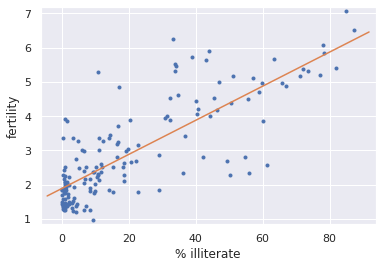

In [ ]:
# Plotting the illiteracy rate versus fertility
_ = plt.plot(illiteracy, fertility, marker='.', linestyle='none')

abline(plt.gca(), slope, intercept)

plt.margins(0.02)
_ = plt.xlabel('% illiterate')
_ = plt.ylabel('fertility')

plt.show()

In [ ]:
# Finding the slope of the best fit line
print(slope)

0.04979854809063423


The line of best fit has a slope of 0.0498

In [ ]:
# Finding the intercept of the best fit line
print(intercept)

1.8880506106365567


The line of best fit has an intercept of 1.888

-------------------
### 1b. Anscombe's quartet

The Anscombe's quartet is a collection of four small data sets that have nearly identical simple descriptive statistics, yet have very different distributions. Each dataset consists of 11 `(x,y)` points. The quartet was created in 1973 by the statistician Francis Anscombe to demonstrate: the importance of visualization and exploratory data analysis (EDA), the effect of outliers and other influential observations on statistical properties, and the limitations of summary statistics (\*).

(\*) See https://heap.io/blog/data-stories/anscombes-quartet-and-why-summary-statistics-dont-tell-the-whole-story if you're interested.

The Python code below performs a linear regression on the data set from Anscombe's quartet that is most reasonably interpreted with linear regression.

In [ ]:
x1 = [10.0, 8.0,  13.0,  9.0,  11.0, 14.0, 6.0,  4.0,  12.0,  7.0,  5.0]
y1 = [8.04, 6.95, 7.58,  8.81, 8.33, 9.96, 7.24, 4.26, 10.84, 4.82, 5.68]

x2 = [10.0, 8.0,  13.0,  9.0,  11.0, 14.0, 6.0,  4.0,  12.0,  7.0,  5.0]
y2 = [9.14, 8.14, 8.74,  8.77, 9.26, 8.10, 6.13, 3.10, 9.13,  7.26, 4.74]

x3 = [10.0, 8.0,  13.0,  9.0,  11.0, 14.0, 6.0,  4.0,  12.0,  7.0,  5.0]
y3 = [7.46, 6.77, 12.74, 7.11, 7.81, 8.84, 6.08, 5.39, 8.15,  6.42, 5.73]

x4 = [8.0,  8.0,  8.0,   8.0,  8.0,  8.0,  8.0,  19.0,  8.0,  8.0,  8.0]
y4 = [6.58, 5.76, 7.71,  8.84, 8.47, 7.04, 5.25, 12.50, 5.56, 7.91, 6.89]

slope = 0.5000909090909094
intercept = 3.000090909090908


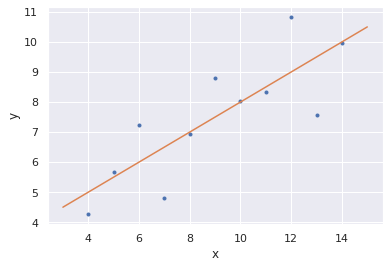

In [ ]:
# Perform linear regression: a, b
a, b = np.polyfit(x1, y1, 1)

# Print the slope and intercept
print('slope =', a)
print('intercept =', b)

# Generate theoretical x and y data: x_theor, y_theor
x_theor = np.array([3, 15])
y_theor = a * x_theor + b

# Plot the Anscombe data and theoretical line
_ = plt.plot(x1, y1, marker='.', linestyle='none')
_ = plt.plot(x_theor, y_theor)

# Label the axes
plt.xlabel('x')
plt.ylabel('y')

# Show the plot
plt.show()

### 1.2 Your turn! (5 points)

### Linear regression on all Anscombe data

Write code to verify that all four of the Anscombe data sets have the same slope and intercept from a linear regression, i.e. compute the slope and intercept for each set. 

The data are stored in lists (`anscombe_x = [x1, x2, x3, x4]` and `anscombe_y = [y1, y2, y3, y4]`), corresponding to the $x$ and $y$ values for each Anscombe data set.

In [ ]:
anscombe_x = [x1, x2, x3, x4]
anscombe_y = [y1, y2, y3, y4]

# Computing the slope and intercept for each set
anscombe_data_sets =[np.polyfit(x, y, 1) for x, y in zip(anscombe_x, anscombe_y)]

# Additional information taken from https://stackoverflow.com/questions/6473283/basic-python-file-io-variables-with-enumerate#:~:text=In%20our%20case%3A-,for%20index%2C%20line%20in%20enumerate(f)%3A,%2C%20line%20from%20file)%20pairs.
for i, line in enumerate(anscombe_data_sets, start=1):
    print((i, line[0], line[1]))

(1, 0.5000909090909094, 3.000090909090908)
(2, 0.5000000000000003, 3.00090909090909)
(3, 0.49972727272727313, 3.0024545454545453)
(4, 0.4999090909090908, 3.001727272727274)


**Anscombe 1:**

Slope = 0.5000909090909094

Intercept = 3.000090909090908


**Anscombe 2:**

Slope = 0.5000000000000003

Intercept = 3.00090909090909


**Anscombe 3:**

Slope = 0.49972727272727313

Intercept = 3.0024545454545453


**Anscombe 4:**

Slope = 0.4999090909090908

Intercept = 3.001727272727274

To conclude, all 4 Anscombe data sets have the same slope and intercept when rounded. 

-------------------
### 1c. Regression using scikit-learn

Now that we know the basics of linear regression, we will switch to scikit-learn, a powerful, workflow-oriented library for data science and machine learning.

The Python code below shows a simple linear regression example using scikit-learn. Note the use of the `fit()` and `predict()` methods.

[2.9776566]
-1.903310725531119


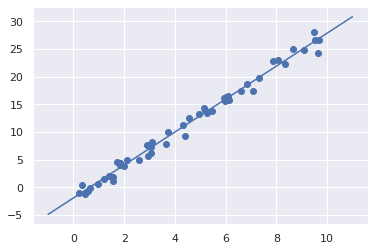

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Generate random data around the y = ax+b line where a=3 and b=-2
rng = np.random.RandomState(42)
x = 10 * rng.rand(50)
y = 3 * x - 2 + rng.randn(50)

from sklearn.linear_model import LinearRegression

# Note: If you get a "ModuleNotFoundError: No module named 'sklearn'" error message, don't panic.
# It probably means you'll have to install the module by hand if you're using pip. 
# If you're using conda, you should not see any error message.

model = LinearRegression(fit_intercept=True)

X = x[:, np.newaxis]
X.shape

model.fit(X, y)
print(model.coef_)
print(model.intercept_)

xfit = np.linspace(-1, 11)
Xfit = xfit[:, np.newaxis]
yfit = model.predict(Xfit)

plt.scatter(x, y)
plt.plot(xfit, yfit);

### 1d. Polynomial regression

One way to adapt linear regression to nonlinear relationships between variables is to transform the data according to *basis functions*.

The idea is to take the multidimensional linear model:
$$
y = a_0 + a_1 x_1 + a_2 x_2 + a_3 x_3 + \cdots
$$
and build the $x_1, x_2, x_3,$ and so on, from our single-dimensional input $x$.
That is, we let $x_n = f_n(x)$, where $f_n()$ is some function that transforms our data.

For example, if $f_n(x) = x^n$, our model becomes a polynomial regression:
$$
y = a_0 + a_1 x + a_2 x^2 + a_3 x^3 + \cdots
$$
Notice that this is *still a linear model*—the linearity refers to the fact that the coefficients $a_n$ never multiply or divide each other.
What we have effectively done is taken our one-dimensional $x$ values and projected them into a higher dimension, so that a linear fit can fit more complicated relationships between $x$ and $y$.

The code below shows a simple example of polynomial regression using the ``PolynomialFeatures`` transformer in scikit-learn. Concretely, it shows how we can use polynomial features with a polynomial of degree seven, i.e. $$y = a_0 + a_1 x + a_2 x^2 + a_3 x^3 + \cdots + a_7 x^7$$ 

It also introduces the notion of a *pipeline* in scikit-learn. "The purpose of the pipeline is to assemble several steps that can be cross-validated together while setting different parameters." (https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html) 

The R^2 score for the fit is:  0.9806993128749489


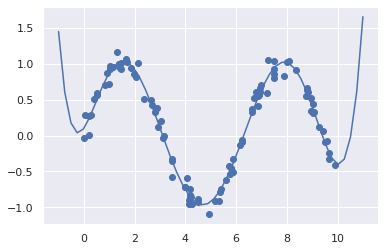

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
poly_model = make_pipeline(PolynomialFeatures(7),
                           LinearRegression())

rng = np.random.RandomState(1)
x = 10 * rng.rand(100)
y = np.sin(x) + 0.1 * rng.randn(100)

poly_model.fit(x[:, np.newaxis], y)
yfit = poly_model.predict(xfit[:, np.newaxis])

plt.scatter(x, y)
plt.plot(xfit, yfit);

print('The R^2 score for the fit is: ', poly_model.score(x[:, np.newaxis], y))

Our linear model, through the use of 7th-order polynomial basis functions, can provide an excellent fit to this non-linear data!

### 1.3 Your turn! (10 points)

Write code to find the best degree/order for the polynomial basis functions (between 1 and 15) by computing the quality of the fit using a suitable metric, in this case the $R^2$ coefficient (which can be computer using the `score()` function). 

Remember that **the best possible score is 1.0**. The score can be negative (because the model can be arbitrarily worse). A score of 0 suggests a constant model that always predicts the expected value of y, disregarding the input features.

Hint: If you plot the score against the degree/order of the polynomial, you should see something like this:
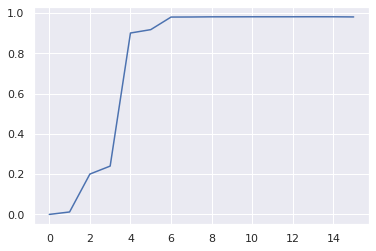


In [ ]:
# Computing the quality of fit using the R^2 coefficient 
# Plotting the score against the degree of the polynomial
rng = np.random.RandomState(1)
x = 10 * rng.rand(100)
y = np.sin(x) + 0.1 * rng.randn(100)

In [ ]:
def variance_percentage(linear_regression_sequence):

    poly_model = make_pipeline(PolynomialFeatures(linear_regression_sequence), LinearRegression())
    poly_model.fit(x[:, np.newaxis], y)
    
    return poly_model.score(x[:, np.newaxis], y)

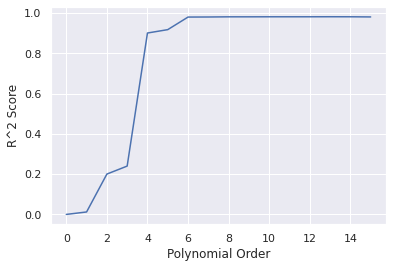

In [ ]:
scores = [variance_percentage(degree) for degree in range(0, 16)]

plt.plot(scores)

plt.ylabel('R^2 Score')
plt.xlabel('Polynomial Order')

plt.show()

### 1e. Regularization

The use of polynomial regression with high-order polynomials can very quickly lead to over-fitting. In this part, we will look into the use of regularization to address potential overfitting.

The code below shows an attempt to fit a 15th degree polynomial to a sinusoidal shaped data. The fit is excellent ($R^2$ > 0.98), but might raise suspicions that it will lead to overfitting.

0.9806993128749489


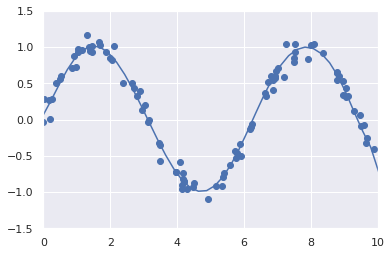

In [ ]:
model = make_pipeline(PolynomialFeatures(15),
                      LinearRegression())
model.fit(x[:, np.newaxis], y)

plt.scatter(x, y)
plt.plot(xfit, model.predict(xfit[:, np.newaxis]))

plt.xlim(0, 10)
plt.ylim(-1.5, 1.5);

score = poly_model.score(x[:, np.newaxis], y)
print(score)

### 1.4 Your turn! (5 points)

Write Python code to perform Ridge regression ($L_2$ Regularization), plot the resulting fit, and compute the $R^2$ score.

Hints: 
1. This type of penalized model is built into Scikit-Learn with the ``Ridge`` estimator. 
2. In the beginning, use all default values for its parameters.
3. After you get your code to work, spend some time trying to fine-tune the model, i.e., experimenting with the regularization parameters.

In [ ]:
# Creating an auxiliary function to perform a ridge regression
def experiment_regression(classifier):

    rng = np.random.RandomState(1)
    x = 10 * rng.rand(100)
    y = np.sin(x) + 0.1 * rng.randn(100)

    x_test = np.linspace(-1, 11)
    X = x[:, np.newaxis]
    X_test = x_test[:, np.newaxis]


    model = make_pipeline(PolynomialFeatures(15), classifier)
    model.fit(X, y)
    predict_sample_data = model.predict(X_test)

    plt.scatter(x, y, label = 'Experiment')
    plt.plot(x_test, predict_sample_data, label = 'Prediction')
    plt.legend()
    plt.xlim(0, 10)
    plt.ylim(-1.5, 1.5);

    score = model.score(X, y)
    print(score)
    
    return model

0.9788162291858987


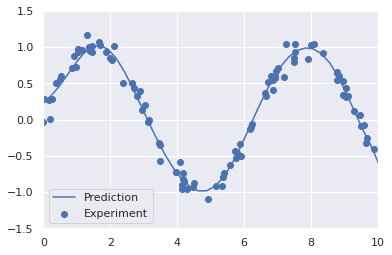

In [ ]:
# Plotting the Ridge Regression resulting fit
from sklearn.linear_model import Ridge

experiment_regression(Ridge(random_state = 42))

plt.show()

### 1.5 Your turn! (5 points)

Write Python code to perform Lasso regression ($L_1$ Regularization), plot the resulting fit, and compute the $R^2$ score.

Hints: 
1. This type of penalized model is built into Scikit-Learn with the ``Lasso`` estimator. 
2. In the beginning, use `Lasso(alpha=0.1, tol=0.2)`
3. After you get your code to work, spend some time trying to fine-tune the model, i.e., experimenting with the regularization parameters.

0.6754347956467595


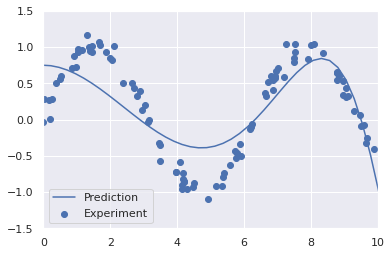

In [ ]:
# Plotting the Lasso Regression resulting fit 
from sklearn.linear_model import Lasso

experiment_regression(Lasso(alpha = 0.1, tol = 0.2))

plt.show()

### 1f. The housing problem
The Boston housing dataset is a classic dataset used in linear regression examples.
(See https://scikit-learn.org/stable/datasets/index.html#boston-dataset for more)

The Python code below:
- Loads the Boston dataset (using scikit-learn's `load_boston()`) and converts it into a Pandas dataframe
- Selects two features to be used for fitting a model that will then be used to make predictions: LSTAT (% lower status of the population) and RM (average number of rooms per dwelling) (\*)
- Splits the data into train and test sets

(\*) See https://towardsdatascience.com/linear-regression-on-boston-housing-dataset-f409b7e4a155 for details.

In [ ]:
from sklearn.datasets import load_boston
boston_dataset = load_boston()
boston = pd.DataFrame(boston_dataset.data, columns=boston_dataset.feature_names)
boston.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function load_boston is deprecated; `load_boston` is deprecated in 1.0 and will be removed in 1.2.

    The Boston housing prices dataset has an ethical problem. You can refer to
    the documentation of this function for further details.

    The scikit-learn maintainers therefore strongly discourage the use of this
    dataset unless the purpose of the code is to study and educate about
    ethical issues in data science and machine learning.

    In this special case, you can fetch the dataset from the original
    source::

        import pandas as pd
        import numpy as np


        data_url = "http://lib.stat.cmu.edu/datasets/boston"
        raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
        data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
        target = raw_df.values[1::2, 2]

    Alternative datasets include the California housing dataset (i.e.

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [ ]:
boston['MEDV'] = boston_dataset.target
X = pd.DataFrame(np.c_[boston['LSTAT'], boston['RM']], columns = ['LSTAT','RM'])
y = boston['MEDV']

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=5)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(404, 2)
(102, 2)
(404,)
(102,)


#### (OPTIONAL EDA)

The (innocent-looking) lines of code below use Pandas Profiling to produce rich reports, plots and insights on the dataset.

Read more about it:

*   https://pypi.org/project/pandas-profiling/ 
*   https://www.datacourses.com/pandas-1150/ 
*   https://pandas-profiling.github.io/pandas-profiling/docs/master/index.html 
*   https://medium.com/analytics-vidhya/pandas-profiling-5ecd0b977ecd  

In [ ]:
# fun with pandas_profiling
profile = ProfileReport(boston, title='Pandas Profiling Report for Boston Housing Dataset', explorative=True)

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 1.6 Bonus! (10 points)

Write Python code to:

1. Fit a linear model to the data.
2. Compute and print the RMSE and $R^2$ score for both train and test datasets.
3. Fit a polynomial model (of degree 4) to the data.
4. Compute and print the RMSE and $R^2$ score for both train and test datasets.
5. Apply Ridge regression to the polynomial model.
4. Compute and print the RMSE and $R^2$ score for both train and test datasets.

####Sources

https://towardsdatascience.com/linear-regression-on-boston-housing-dataset-f409b7e4a155

https://scipy-lectures.org/packages/scikit-learn/auto_examples/plot_boston_prediction.html

https://seaborn.pydata.org/tutorial/regression.html

https://aegis4048.github.io/mutiple_linear_regression_and_visualization_in_python


####Some Data Analysis and Graphing

In [ ]:
# Looking at the first five rows of the data set
display(X.head(5))

,LSTAT,RM
0,4.98,6.575
1,9.14,6.421
2,4.03,7.185
3,2.94,6.998
4,5.33,7.147


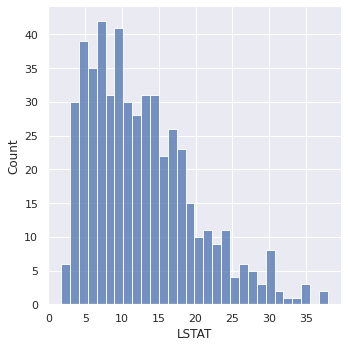

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.displot(X['LSTAT'], bins=30)

plt.show()

Text(0, 0.5, 'MEDV')

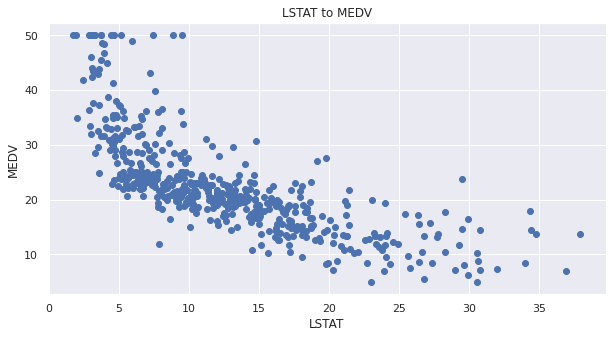

In [ ]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 1, 1)

x = boston['LSTAT']

plt.scatter(x, y, marker='o')

plt.title('LSTAT to MEDV')

plt.xlabel('LSTAT')
plt.ylabel('MEDV')

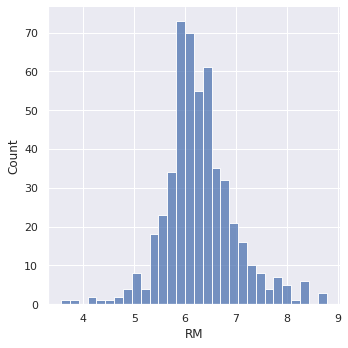

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.displot(X['RM'], bins=30)

plt.show()

Text(0, 0.5, 'MEDV')

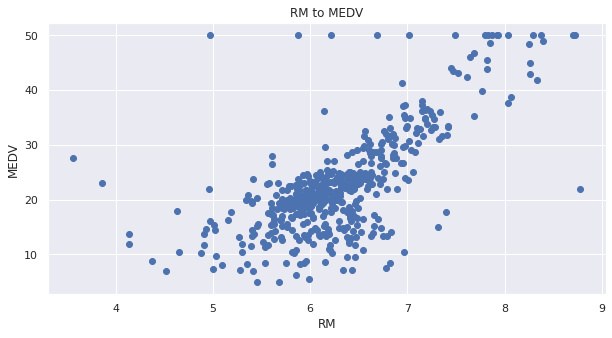

In [ ]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 1, 1)

x = boston['RM']

plt.scatter(x, y, marker='o')

plt.title('RM to MEDV')

plt.xlabel('RM')
plt.ylabel('MEDV')

####A 3D Plot Linear Regression Attempt (Points for Difficulty)

Attempt to visualize the linear regression in 3d space plotting both LSTAT and RM against MEDV on the same graph. 

Code sourced from blog post *Multiple Linear Regression and Visualization in Python* (Nov 2019) available at 
https://aegis4048.github.io/mutiple_linear_regression_and_visualization_in_python


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import linear_model
from mpl_toolkits.mplot3d import Axes3D

######################################## Data preparation #########################################

X = boston[['LSTAT', 'RM']].values.reshape(-1,2)
Y = boston['MEDV']

######################## Prepare model data point for visualization ###############################

x = X[:, 0]
y = X[:, 1]
z = Y

x_pred = np.linspace(2, 20, 40)   # range of LSTAT values
y_pred = np.linspace(1, 6, 9)  # range of RM values

xx_pred, yy_pred = np.meshgrid(x_pred, y_pred)

model_viz = np.array([xx_pred.flatten(), yy_pred.flatten()]).T

In [ ]:
################################################ Train #############################################

ols = linear_model.LinearRegression()
model = ols.fit(X, Y)
predicted = model.predict(model_viz)

In [ ]:
############################################## Evaluate ############################################

r2 = model.score(X, Y)

print (r2)

0.6385616062603403


Text(0.5, 0.98, '$R^2 = 0.64$')

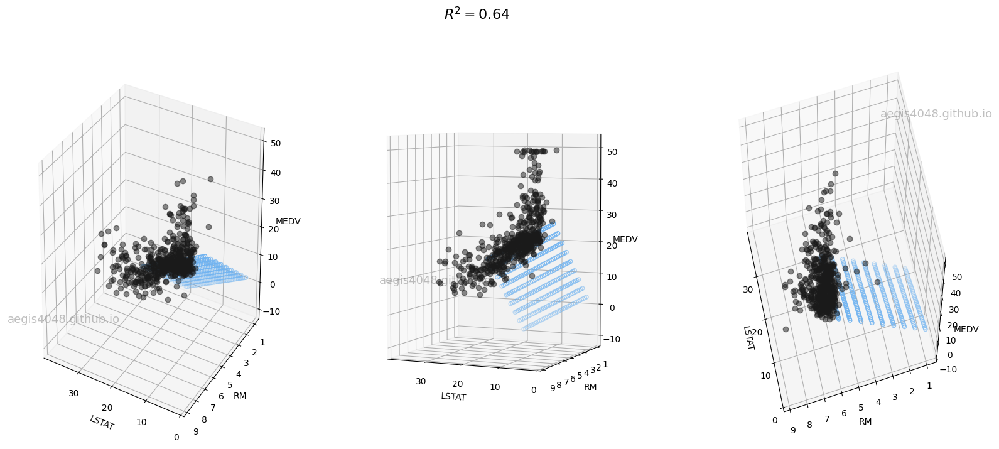

In [ ]:
############################################## Plot ################################################

plt.style.use('default')

fig = plt.figure(figsize=(20, 8))

ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

axes = [ax1, ax2, ax3]

for ax in axes:
    ax.plot(x, y, z, color='k', zorder=15, linestyle='none', marker='o', alpha=0.5)
    
    ax.scatter(xx_pred.flatten(), yy_pred.flatten(), predicted, facecolor=(0,0,0,0), s=20, edgecolor='#70b3f0')

    ax.set_xlabel('LSTAT', fontsize=10)
    ax.set_ylabel('RM', fontsize=10)
    ax.set_zlabel('MEDV', fontsize=10)
    
    ax.locator_params(nbins=4, axis='x')
    ax.locator_params(nbins=5, axis='x')

ax1.text2D(0.2, 0.32, 'aegis4048.github.io', fontsize=13, ha='center', va='center',
           transform=ax1.transAxes, color='grey', alpha=0.5)

ax2.text2D(0.3, 0.42, 'aegis4048.github.io', fontsize=13, ha='center', va='center',
           transform=ax2.transAxes, color='grey', alpha=0.5)

ax3.text2D(0.85, 0.85, 'aegis4048.github.io', fontsize=13, ha='center', va='center',
           transform=ax3.transAxes, color='grey', alpha=0.5)

ax1.view_init(elev=28, azim=120)
ax2.view_init(elev=4, azim=114)
ax3.view_init(elev=60, azim=165)

fig.suptitle('$R^2 = %.2f$' % r2, fontsize=16)

#fig.tight_layout()

####1 & 2: Computing RMSE and R^2 (Linear Regression)

In [ ]:
# Fitting a linear model to the data
# Inspiration taken from https://towardsdatascience.com/linear-regression-on-boston-housing-dataset-f409b7e4a155
lin_model = LinearRegression()
lin_model.fit(X_train, y_train)

LinearRegression()

In [ ]:
# Computing the RMSE and R^2
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

def rmse_and_r2score(model):
    y_train_predict = model.predict(X_train)
    y_test_predict = model.predict(X_test)

    print((np.sqrt(mean_squared_error(y_train, y_train_predict)), r2_score(y_train, y_train_predict)))
    print((np.sqrt(mean_squared_error(y_test, y_test_predict)), r2_score(y_test, y_test_predict)))

rmse_and_r2score(lin_model)

(5.6371293350711955, 0.6300745149331701)
(5.137400784702911, 0.6628996975186952)


**Train Dataset:**

RMSE = 5.637

R^2 = 0.630

**Test Dataset:**

RMSE = 5.137

R^2 = 0.663

####3 & 4: Computing RMSE and R^2 (Polynomial Model)

In [ ]:
# Computing the RMSE and R^2
polynomial_model = make_pipeline(PolynomialFeatures(4), LinearRegression())
polynomial_model.fit(X_train, y_train);

In [ ]:
# Fitting a polynomial model to the data 
rmse_and_r2score(polynomial_model)

(4.276081212074235, 0.7871419186085669)
(3.8885945978984418, 0.8068665120648728)


**Train Dataset:**

RMSE = 4.276

R^2 = 0.787

**Test Dataset:**

RMSE = 3.889

R^2 = 0.807

#### 5 & 6: Computing RMSE and R^2 (Ridge Regression)

In [ ]:
# Computing the RMSE and R^2
ridge_polynomial_model = make_pipeline(PolynomialFeatures(4), Ridge())
ridge_polynomial_model.fit(X_train, y_train)

plt.show()

In [ ]:
# Applying the polynomial model to ridge regression
rmse_and_r2score(ridge_polynomial_model)

(4.468374763098667, 0.7675671891343007)
(3.9187948019923025, 0.8038549767145465)


**Train Dataset:**

RMSE = 4.468

R^2 = 0.768

**Test Dataset:**

RMSE = 3.919

R^2 = 0.804

-------------------
## Part 2: Classification

### 2a. The Iris dataset 

The Python code below will load a dataset containing information about three types of Iris flowers that had the size of its petals and sepals carefully measured.

The Fisher’s Iris dataset contains 150 observations with 4 features each: 
- sepal length in cm; 
- sepal width in cm; 
- petal length in cm; and 
- petal width in cm. 

The class for each instance is stored in a separate column called “species”. In this case, the first 50 instances belong to class Setosa, the following 50 belong to class Versicolor and the last 50 belong to class Virginica.

See:
https://archive.ics.uci.edu/ml/datasets/Iris for additional information.

In [43]:
# Imports
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import pandas as pd

import seaborn as sns; sns.set()

import scipy.stats as ss

from pandas_profiling import ProfileReport

from tensorflow import keras
from tensorflow.keras import layers

In [44]:
iris = sns.load_dataset("iris")
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


#### Histograms, pair plots and summary statistics 

The code below:

1. Computes and displays relevant summary statistics for the whole dataset.
2. Displays the pair plots for all (4) attributes for all (3) categories / species / classes in the Iris dataset. 

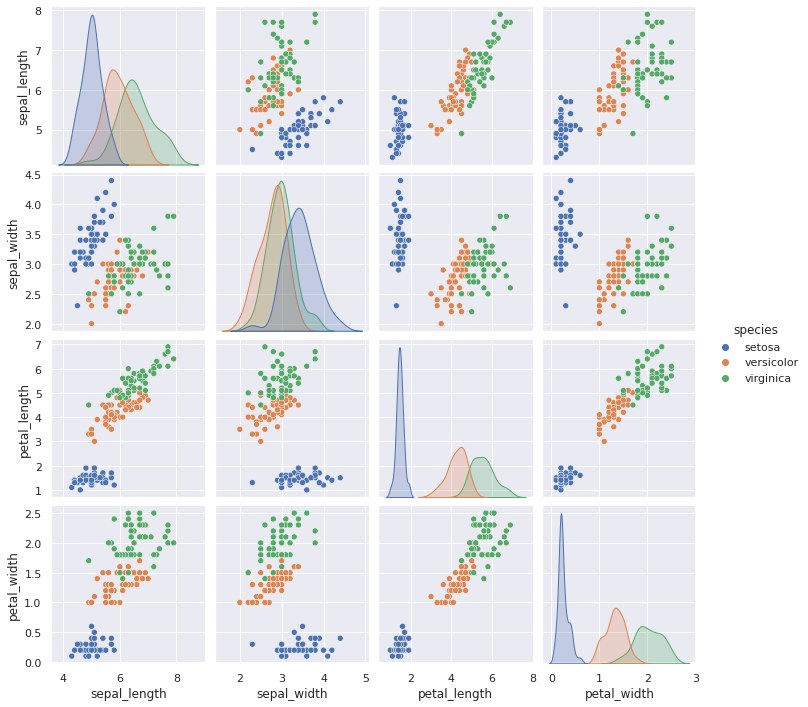

In [45]:
# Display pair plot
sns.pairplot(iris, hue='species', height=2.5);

In [46]:
# Display summary statistics for the whole dataset
iris.describe()

,sepal_length,sepal_width,petal_length,petal_width
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333
std,0.828066,0.435866,1.765298,0.762238
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


### 2.1 Your turn! (15 points) - *DecisionTreeClassfier*
Write code to: 

1. Build a decision tree classifier using scikit-learn's `DecisionTreeClassifier` (using the default options). Check documentation at https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html 
2. Plot the resulting decision tree. 
(Note: if `graphviz` gives you headaches, a text-based 'plot'-- using `export_text` -- should be OK.)
3. Perform k-fold cross-validation using k=3 and display the results. 


#### *A note on sources*
We source much of this code from https://towardsdatascience.com/introduction-to-decision-tree-classifiers-from-scikit-learn-32cd5d23f4d
which is probably the best example of dealing with this data set using
DecisionTreeClassfiers but also we do leverage some code from
from the text Hands-On Machine Learning with Scikit-Learn, 
Keras & TensorFlow by Aurelien Geron, O'Reilly Press 2019 Chapter 4 and 6
(which does not rely on Google Colab so is somewhat confusing to integrate) 
as well as code from https://www.youtube.com/watch?v=pvXL_QSn2zI 
which uses iris data set for analysis and examples and has a good walk 
through on how to plot the results (visualize them)

The Confusion Matrix code as well as the analytics behind it, as well as the explanatory text is taken directly from  https://towardsdatascience.com/introduction-to-decision-tree-classifiers-from-scikit-learn-32cd5d23f4d written by a Phillip Wilinson who is a CASA PhD Student specializing in Spatial Analysis, Data Science and Software Engineering (over 250k views actually).

####*DecisionTreeClassfier Code and Analysis*

In [47]:
#
# base imports and data set load
#
from sklearn.datasets import load_iris
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

irisData = load_iris()

In [48]:
#
# this prints out contents of iris data set
#
#irisData

In [49]:
type(irisData)

sklearn.utils.Bunch

In [50]:
irisData.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [51]:
irisData.target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [52]:
irisData.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [53]:
#
# convert into Panda dataframe for analysis
#
irisDF = pd.DataFrame(irisData.data)
irisDF.head()

,0,1,2,3
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [54]:
irisData.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [55]:
# add column names
irisDF.columns = ['SepalLength', 'SepalWidth', 'PetalLength', 'PedalWidth']
irisDF.head(10)

,SepalLength,SepalWidth,PetalLength,PedalWidth
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
5,5.4,3.9,1.7,0.4
6,4.6,3.4,1.4,0.3
7,5.0,3.4,1.5,0.2
8,4.4,2.9,1.4,0.2
9,4.9,3.1,1.5,0.1


In [56]:
# create the species column
irisDF['Species'] = irisData.target

#replace this with the actual names
target = np.unique(irisData.target)
target_names = np.unique(irisData.target_names)
targets = dict(zip(target, target_names))

irisDF['Species'] = irisDF['Species'].replace(targets)

irisDF.head(15)

,SepalLength,SepalWidth,PetalLength,PedalWidth,Species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
5,5.4,3.9,1.7,0.4,setosa
6,4.6,3.4,1.4,0.3,setosa
7,5.0,3.4,1.5,0.2,setosa
8,4.4,2.9,1.4,0.2,setosa
9,4.9,3.1,1.5,0.1,setosa


In [57]:
#extract features and target variables
x = irisDF.drop(columns="Species")
y = irisDF["Species"]

#save the feature name and target variables
feature_names = x.columns
labels = y.unique()

In [58]:
#
# split the data up
# 80% training data and 20% test data (options)
#

from sklearn.model_selection import train_test_split

X = irisData.data
y = irisData.target

X_train, test_x, y_train, test_lab = train_test_split(x,y,
                                                 test_size = 0.2,
                                                 random_state = 0)    # as per instructions

In [59]:
#
# create the DT Classifier
#
# entropy moves from state of disorder to order
#
irisDTC1 = DecisionTreeClassifier(max_depth=3, criterion='entropy', random_state=0)  

irisDTC1.fit(X_train, y_train)                                    # fit on training data

DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=0)

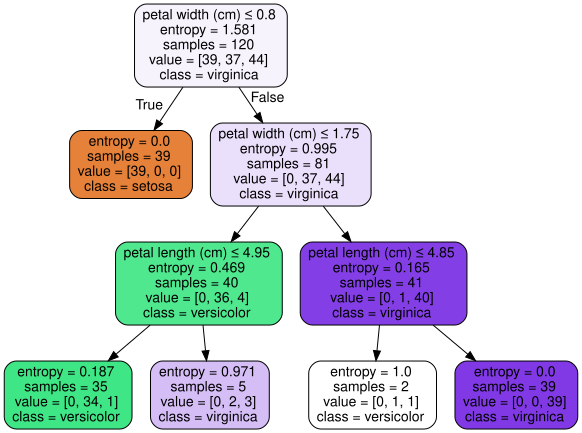

In [60]:
#
# summarize model using graphviz library
#
import graphviz

from sklearn.tree import export_graphviz

dot_data = export_graphviz(
    irisDTC1,
    out_file=None,
    feature_names=irisData.feature_names,
    class_names=irisData.target_names,
    filled=True,
    rounded=True,
    special_characters=True
)

# visualize model
graph=graphviz.Source(dot_data)
graph

In [61]:
#
# predict against the allotted test data set
#
predicted_data = irisDTC1.predict(test_x)

predicted_data

array([2, 1, 0, 2, 0, 2, 0, 1, 1, 1, 2, 1, 1, 1, 1, 0, 1, 1, 0, 0, 2, 1,
       0, 0, 1, 0, 0, 1, 1, 0])

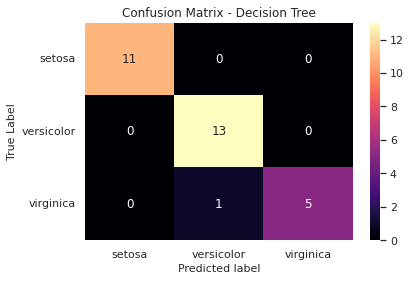

<Figure size 864x648 with 0 Axes>

In [62]:
##################################################################################
# 
# The Confusion Matrix code as well as the analytics behind it, as well as the
# explanatory text is taken directly from  
# https://towardsdatascience.com/introduction-to-decision-tree-classifiers-from-scikit-learn-32cd5d23f4d
# written by a Phillip Wilinson who is a CASA PhD Student specializing in
# Spatial Analysis, Data Science and Software Engineering (over 250k views actually)
#
# I include much of the explantory text here in the code verbatim 
# because it is very helpful, and of course typing the text itself, as well as
# copying and getting the code to work, even though it is a straight copy for 
# the most part, greatly facilitates the process of understanding how it works, 
# and of course for future reference when I come back to it
#
##################################################################################

from sklearn import metrics
import seaborn as sns
import matplotlib.pyplot as plt

#get the confusion matrix
confusion_matrix = metrics.confusion_matrix(test_lab, predicted_data)

#turn this into a dataframe
matrix_df = pd.DataFrame(confusion_matrix)

#plot the result
ax = plt.axes()
sns.set(font_scale=1)
plt.figure(figsize=(12,9))
sns.heatmap(matrix_df, annot=True, fmt="g", ax=ax, cmap="magma")

#set axis titles
ax.set_title('Confusion Matrix - Decision Tree')
ax.set_xlabel("Predicted label", fontsize =11)
ax.set_xticklabels(['']+labels)
ax.set_ylabel("True Label", fontsize=11)
ax.set_yticklabels(list(labels), rotation = 0)
plt.show()

In [63]:
#
# Accuracy
#
# The accuracy score is the fraction of true positives and true negatives 
# over the total number of assigned labels and is calculated as:
#
# sum(diagonals in the confusion matrix) / sum (all boxes in the confusion matrix)
#
metrics.accuracy_score(test_lab, predicted_data)

0.9666666666666667

In [64]:
#
# Precision: get the precision score
#
# This tells us how many of the values we predicted to be in a certain class 
# are actually in that class. Essentially, this tells us how we performed in 
# terms of false positives. It is calculated as:
#
# True positive (number in diagonal)/All positives (column sum)
#
precision = metrics.precision_score(test_lab,
                                   predicted_data, 
                                   average=None)
#turn it into a dataframe
precision_results = pd.DataFrame(precision, index=labels)

#rename the results column
precision_results.rename(columns={0:'precision'}, inplace =True)

precision_results

,precision
setosa,1.000000
versicolor,0.928571
virginica,1.000000


In [65]:
#
# Recall
#
# This tells us how many of the values in each class were given 
# the correct label, thus telling use how it performed relative 
# to false negatives. It is calculated as:
#
# True positive (number in diagonal)/All assignments (row sum)
#
recall = metrics.recall_score(test_lab, predicted_data, 
                              average =None)
recall_results = pd.DataFrame(recall, index= labels)
recall_results.rename(columns ={0:'Recall'}, inplace =True)
recall_results

,Recall
setosa,1.000000
versicolor,1.000000
virginica,0.833333


In [66]:
#
# calculate f1
#
# This is a weighted average of precision and recall scale, with 1 being 
# the best and 0 the worst. This uses the harmonmic mean, so that the 
# value is closer to the smaller number, and prevents overestimating the 
# performance of the model in cases where one parameter is high and the 
# other low. It is calculated as:
#
# 2 * (precision * recall)/(precision + recall)
#
f1 = metrics.f1_score(test_lab, predicted_data, average=None)
f1_results = pd.DataFrame(f1, index=labels)

f1_results.rename(columns={0:'f1'}, inplace=True)
f1_results

,f1
setosa,1.000000
versicolor,0.962963
virginica,0.909091


In [67]:
# all metrics with one line of code
print(metrics.classification_report(test_lab,
                                    predicted_data))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        11
           1       0.93      1.00      0.96        13
           2       1.00      0.83      0.91         6

    accuracy                           0.97        30
   macro avg       0.98      0.94      0.96        30
weighted avg       0.97      0.97      0.97        30



In [68]:
#
# Feature importance
#
# Another useful feature is calculating the importance of each of the 
# features in the final tree output. This is the total amount that the 
# gini index or entropy index (gini in our case) decreases due to splits 
# over a given feature. This can be gained from:

#extract importance
importance = pd.DataFrame({'feature': X_train.columns,
                           'importance' : np.round(irisDTC1.feature_importances_, 3)})

importance.sort_values('importance', ascending=False, inplace = True)

print(importance)

       feature  importance
3   PedalWidth       0.931
2  PetalLength       0.069
0  SepalLength       0.000
1   SepalWidth       0.000


In [69]:
#
# Improving the model
#
# We can try to improve the model by changing the features used, but we can 
# also see how it responds to changes in hyperparameters by using GridSearchCV. 
# This performs cross validation on the model by performing the algorithm on 
# multiple runs of the sets of the training set, and tells us how the model responds.
#
# For our purpose, we can change the max_depth and min_samples_split parameters 
# which control how deep the tree goes, and the number of samples required 
# to split an internal node.

from sklearn.model_selection import GridSearchCV

tuned_parameters = [{'max_depth': [1,2,3,4,5], 
                     'min_samples_split': [2,4,6,8,10]}]

scores = ['recall']

for score in scores:    
    print()
    print(f"Tuning hyperparameters for {score}")
    print()
    
    clf = GridSearchCV(
        DecisionTreeClassifier(), tuned_parameters,
        scoring = f'{score}_macro'
    )
    clf.fit(X_train, y_train)
    
    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    
    means = clf.cv_results_["mean_test_score"]
    stds = clf.cv_results_["std_test_score"]
    
    for mean, std, params in zip(means, stds,
                                 clf.cv_results_['params']):
        print(f"{mean:0.3f} (+/-{std*2:0.03f}) for {params}")


Tuning hyperparameters for recall

Best parameters set found on development set:

{'max_depth': 2, 'min_samples_split': 2}

Grid scores on development set:
0.667 (+/-0.000) for {'max_depth': 1, 'min_samples_split': 2}
0.667 (+/-0.000) for {'max_depth': 1, 'min_samples_split': 4}
0.667 (+/-0.000) for {'max_depth': 1, 'min_samples_split': 6}
0.667 (+/-0.000) for {'max_depth': 1, 'min_samples_split': 8}
0.667 (+/-0.000) for {'max_depth': 1, 'min_samples_split': 10}
0.954 (+/-0.060) for {'max_depth': 2, 'min_samples_split': 2}
0.954 (+/-0.060) for {'max_depth': 2, 'min_samples_split': 4}
0.954 (+/-0.060) for {'max_depth': 2, 'min_samples_split': 6}
0.945 (+/-0.064) for {'max_depth': 2, 'min_samples_split': 8}
0.954 (+/-0.060) for {'max_depth': 2, 'min_samples_split': 10}
0.936 (+/-0.082) for {'max_depth': 3, 'min_samples_split': 2}
0.928 (+/-0.079) for {'max_depth': 3, 'min_samples_split': 4}
0.936 (+/-0.082) for {'max_depth': 3, 'min_samples_split': 6}
0.928 (+/-0.079) for {'max_depth': 

#### Validate the Results using K-Fold Validation

#####K Fold Example 1 (Sourced from https://satishgunjal.com/kfold/#19)

In [ ]:
# 
# the code below is sourced from blog post by 
# Gunjal, Satish entitled "K Fold Cross Validation" 
# at https://satishgunjal.com/kfold/#19
#

"""
Why we are using '-' sign to calculate RMSE?
ANS: Classification accuracy is reward function, means something you want to maximize. Mean Square Error is loss function, 
means something you want to minimize. Now if we use 'cross_val_score' function then best score(high value) will give worst 
model in case of loss function! There are other sklearn functions which also depends on 'cross_val_score' to select best model by
looking for highest scores, so a design decision was made for 'cross_val_score' to negate the output of all loss function. 
So that when other sklearn function calls 'cross_val_score' those function can always assume that highest score indicate better model.
In short ignore the negative sign and rate the error based on its absolute value.
"""
def rmse(score):
    rmse = np.sqrt(-score)
    print(f'rmse= {"{:.2f}".format(rmse)}')

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score

#
# Lets split the data into 3 folds, as per instructions 
# We will use this 'kf'(StratiFiedKFold splitting stratergy) object as 
# input to cross_val_score() method. The folds are made by preserving 
# the percentage of samples for each class.
#
kf = StratifiedKFold(n_splits=3, shuffle=True, random_state=0)

#
# note, variable definitions
#
# X = irisData.data
# y = irisData.target
#

#
# NB split() method generate indices to split data into training and test set.
#
cnt = 1

for train_index, test_index in kf.split(X, y):
    
    print(f'Fold:{cnt}, Train set: {len(train_index)}, Test set:{len(test_index)}')

    print("Training Set Indeces: ", train_index)
    print("Test Set Indeces: ", test_index) 

    cnt+=1

    #
    # Note that: 
    # cross_val_score() parameter 'cv' will by default use StratifiedKFold 
    # splitting strategy if we just specify value of number of folds. 
    # So you can bypass above step and just specify 
    # cv=5 in cross_val_score() function
    #
    score = cross_val_score(tree.DecisionTreeRegressor(random_state= 0), X, y, cv=kf, scoring="neg_mean_squared_error")
    print(f'Scores for each fold: {score}')

    # another metric, using default which looks to be accuracy
    score2 = cross_val_score(tree.DecisionTreeRegressor(random_state= 0), X, y, cv=kf)
    print(f'Scores2 for each fold: {score2}')

    rmse(score.mean())

    print(score2.mean())

Fold:1, Train set: 100, Test set:50
Training Set Indeces:  [  0   3   5   6   7   8  10  11  12  13  14  17  18  19  21  22  24  25
  26  29  31  32  33  36  37  39  40  41  42  44  45  48  49  51  52  55
  57  58  59  60  62  63  64  65  67  68  69  70  71  72  74  75  76  78
  80  83  84  85  87  88  90  93  94  95  97  98 101 102 103 106 107 108
 109 110 111 112 115 116 117 118 121 124 125 126 127 128 129 131 132 133
 134 136 138 140 141 143 144 146 147 148]
Test Set Indeces:  [  1   2   4   9  15  16  20  23  27  28  30  34  35  38  43  46  47  50
  53  54  56  61  66  73  77  79  81  82  86  89  91  92  96  99 100 104
 105 113 114 119 120 122 123 130 135 137 139 142 145 149]
Scores for each fold: [-0.04 -0.06 -0.06]
Scores2 for each fold: [0.93935719 0.91176471 0.90903578]
rmse= 0.23
0.9200525571053163
Fold:2, Train set: 100, Test set:50
Training Set Indeces:  [  1   2   3   4   6   9  11  13  15  16  17  18  20  23  24  26  27  28
  30  32  33  34  35  36  38  40  43  44  45  46 

#####K Fold Example 2 (Sourced from prior assignment code)

In [ ]:
#
# this is a second attempt at K Fold Validation using code from
# previous assignment
# 
# here we define the 
# build model function for K Fold Validation using 'entropy'
# which is an attrubute of the order of a given system (information theory)
#
def build_model():
  return DecisionTreeClassifier(max_depth=3, criterion='entropy', random_state=0)  

In [ ]:
#
# perform k fold validation, this code from assignment 2
# and actually does a 3x3 evaluation, using a top level and mid level
# kfold technique that while looks elegant is merely a function of the fact
# that I do not know how to evaluate the score of DecisionTreeMatrix 
# without using the kfold technique that is embedded in the 
# sklearn.model_selection.cross_val_score method
#
# nonethless we leave it here for reference
#
k = 3

#
# from code above
# 
# X = irisData.data
# y = irisData.target
#

num_val_samples = len(irisData.data) // k
all_scores = []

for i in range(k):

    #print(f"Processing fold #{i}")
    
    firstindex = i*num_val_samples
    secondindex = (i+1)*num_val_samples

    print(f"FOLD #{i} Validation Data: train_data[{firstindex}:{secondindex}]")
    
    val_data = irisData.data[i * num_val_samples: (i + 1) * num_val_samples]
    val_targets = irisData.target[i * num_val_samples: (i + 1) * num_val_samples]

    print(f"val_data shape: {val_data.shape}")

    print(f"FOLD #{i} (Partial) Train Data: irisData.data[:{firstindex}] + irisData.data[{secondindex}:]")

    #
    # note that the partial_train_data
    # is all of the validation data that is NOT
    # included in teh array above, ie val_data
    #
    partial_train_data = np.concatenate(
        [irisData.data[:i * num_val_samples],
         irisData.data[(i + 1) * num_val_samples:]],
        axis=0)
    partial_train_targets = np.concatenate(
        [irisData.target[:i * num_val_samples],
         irisData.target[(i + 1) * num_val_samples:]],
        axis=0)

    print(f"partial_train_data shape: {partial_train_data.shape}")

    print("building, fitting and evaluating model...")

    model = build_model()

    scores = cross_val_score(model, partial_train_data, partial_train_targets, cv=kf, scoring="accuracy")
    print("scores: ", scores)

    print()
    
    all_scores.append(scores)   

FOLD #0 Validation Data: train_data[0:50]
val_data shape: (50, 4)
FOLD #0 (Partial) Train Data: irisData.data[:0] + irisData.data[50:]
partial_train_data shape: (100, 4)
building, fitting and evaluating model...
scores:  [0.91176471 0.96969697 0.87878788]

FOLD #1 Validation Data: train_data[50:100]
val_data shape: (50, 4)
FOLD #1 (Partial) Train Data: irisData.data[:50] + irisData.data[100:]
partial_train_data shape: (100, 4)
building, fitting and evaluating model...
scores:  [1. 1. 1.]

FOLD #2 Validation Data: train_data[100:150]
val_data shape: (50, 4)
FOLD #2 (Partial) Train Data: irisData.data[:100] + irisData.data[150:]
partial_train_data shape: (100, 4)
building, fitting and evaluating model...
scores:  [1. 1. 1.]



In [ ]:
print(all_scores)

[array([0.91176471, 0.96969697, 0.87878788]), array([1., 1., 1.]), array([1., 1., 1.])]


### 2b. Digit classification

The MNIST handwritten digit dataset consists of a training set of 60,000 examples, and a test set of 10,000 examples. Each image in the dataset has 28$\times$28 pixels. 

The Python code below loads the images from the MNIST dataset, flattens them, normalizes them (i.e., maps the intensity values from [0..255] to [0..1]), and displays a few images from the training set.

####*MNIST Data Load and Transform*

In [70]:
from keras.datasets import mnist

# Model / data parameters
num_classes = 10
input_shape = (28, 28, 1)

# the data, split between train and validation sets
(X_train, y_train), (X_valid, y_valid) = mnist.load_data()

11501568/11490434 [==============================] - 0s 0us/step


In [71]:
X_train.shape

(60000, 28, 28)

In [72]:
y_train.shape

(60000,)

In [73]:
y_train[0:12]

array([5, 0, 4, 1, 9, 2, 1, 3, 1, 4, 3, 5], dtype=uint8)

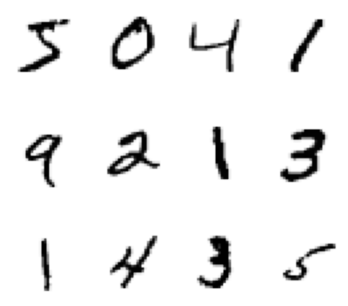

In [74]:
plt.figure(figsize=(5,5))
for k in range(12):
    plt.subplot(3, 4, k+1)
    plt.imshow(X_train[k], cmap='Greys')
    plt.axis('off')
plt.tight_layout()
plt.show()

In [75]:
X_valid.shape

(10000, 28, 28)

In [76]:
y_valid.shape

(10000,)

In [77]:
y_valid[0]

7

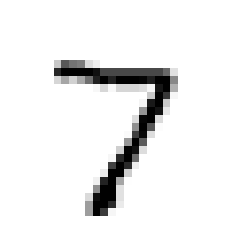

In [78]:
plt.imshow(X_valid[0], cmap='Greys')
plt.axis('off')
plt.show()

In [79]:
# Reshape (flatten) images 
X_train_reshaped = X_train.reshape(60000, 784).astype('float32')
X_valid_reshaped = X_valid.reshape(10000, 784).astype('float32')

# Scale images to the [0, 1] range
X_train_scaled_reshaped = X_train_reshaped / 255
X_valid_scaled_reshaped = X_valid_reshaped / 255

# Renaming for conciseness
X_training = X_train_scaled_reshaped
X_validation = X_valid_scaled_reshaped

print("X_training shape (after reshaping + scaling):", X_training.shape)
print(X_training.shape[0], "train samples")
print("X_validation shape (after reshaping + scaling):", X_validation.shape)
print(X_validation.shape[0], "validation samples")

X_training shape (after reshaping + scaling): (60000, 784)
60000 train samples
X_validation shape (after reshaping + scaling): (10000, 784)
10000 validation samples


In [80]:
# convert class vectors to binary class matrices
y_training = keras.utils.to_categorical(y_train, num_classes)
y_validation = keras.utils.to_categorical(y_valid, num_classes)

In [81]:
print(y_valid[0])
print(y_validation[0])

7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]


### 2.2 Your turn! (10 points) - *Naive Bayes Classification*

Write code to: 

1. Build and fit a 10-class Naive Bayes classifier using scikit-learn's `MultinomialNB()` with default options and using the raw pixel values as features. 
2. Make predictions on the test data, compute the overall accuracy and plot the resulting confusing matrix.

Hint: your accuracy will be around 83.5%

##### *Sources*

https://lazyprogrammer.me/bayes-classifier-and-naive-bayes-tutorial-using/
https://dmkothari.github.io/Machine-Learning-Projects/Naive_Bayes_with_MNIST.html
https://en.wikipedia.org/wiki/Bayes%27_theorem
https://www.saedsayad.com/naive_bayesian.htm#:~:text=Bayes%20theorem%20provides%20a%20way,is%20called%20class%20conditional%20independence
https://docs.w3cub.com/scikit_learn/modules/generated/sklearn.naive_bayes.multinomialnb

##### *Notes: What is a Naive Bayes (Algorithm) Classfier?*


From https://www.saedsayad.com/naive_bayesian.htm#:~:text=Bayes%20theorem%20provides%20a%20way,is%20called%20class%20conditional%20independence


*The Naive Bayesian classifier is based on Bayes’ theorem with the independence assumptions between predictors. A Naive Bayesian model is easy to build, with no complicated iterative parameter estimation which makes it particularly useful for very large datasets. Despite its simplicity, the Naive Bayesian classifier often does surprisingly well and is widely used because it often outperforms more sophisticated classification methods.*

**Algorithm**		
*Bayes theorem provides a way of calculating the posterior probability, P(c|x), from P(c), P(x), and P(x|c). Naive Bayes classifier assume that the effect of the value of a predictor (x) on a given class (c) is independent of the values of other predictors. This assumption is called class conditional independence.*

![picture](https://drive.google.com/uc?export=view&id=1bHfAH1cWccZYwYXNHsUlqLPGpVP9OK_H)


*P(c|x) is the posterior probability of class (target) given predictor (attribute). 
P(c) is the prior probability of class. 
P(x|c) is the likelihood which is the probability of predictor given class. 
P(x) is the prior probability of predictor.*

##### *R&D: Hand Coded Naive Baynes Example (MNIST)*

The example NB code (and text) are from https://dmkothari.github.io/Machine-Learning-Projects/Naive_Bayes_with_MNIST.html

Author: Dhairya Kothari: Title: *MNIST with Naive Bayes*

*Naive Bayes is a probablity generative model where in we define probablity for and against one class (binary classifier). We will produce 10 models for all 10 digit class then predict the class on taking the maximum probablity of all the classes for a given digit.*

*Approach for this method:*

- Preprocess the data and prepare it for the functions
- Preprocess includes 0-255 normalization (data was 0-1 normalized so I multiplied 255)
- Define the Naive Bayes function
- Train with training data set (One vs All classifiers- all 10)
- Play with various smoothing values to get the global optimum values
- Get the optimum test accuracy
- Get the individual number accuracy
- Plot the partial probability images for one correctly classified and one failed image to see if we can say anything from those

In [82]:
###############################################################################
#
# from 
# https://dmkothari.github.io/Machine-Learning-Projects/Naive_Bayes_with_MNIST.html
# 
###############################################################################

# import packages and data

from scipy.stats import mode
import numpy as np

#from mnist import MNIST
from time import time

import pandas as pd
import os
import matplotlib.pyplot as matplot
import matplotlib
%matplotlib inline

import random
matplot.rcdefaults()

from IPython.display import display, HTML
from itertools import chain
from sklearn.metrics import confusion_matrix
import seaborn as sb

In [83]:
###############################################################
# 
# From 
# https://dmkothari.github.io/Machine-Learning-Projects/Naive_Bayes_with_MNIST.html
#
# We Assume that the probability model for each pixel is Gaussian (ie the
# normal Bell curve, see https://en.wikipedia.org/wiki/Normal_distribution)
# and that the probability of each class—i.e., digit—is equal. 
# That is, P(c = 0) = P(c = 1) = : : : = P(c = 9) 
# 
# Let x = (x1; x2; : : : ; x784) be the vector of pixel values for a given 
# image and c is the class or digit, 0 to 9. 
# 
# Hence for comparison we eliminate the Pr(C).
#
#################################################################

def naivebayes(train, train_lb, test, test_lb, smoothing):
        n_class = np.unique(train_lb)
        tr = train
        te = test
        tr_lb = train_lb
        te_lb = test_lb
        smoothing = smoothing
        st = time()
        m, s, prior, count = [], [], [], []
        for i, val in enumerate(n_class):
            sep = [tr_lb == val] 
            count.append(len(tr_lb[sep]))
            prior.append(len(tr_lb[sep]) / len(tr_lb))
            m.append(np.mean(tr[sep], axis=0))
            s.append(np.std(tr[sep], axis=0))
        
        pred = []
        likelihood = []
        #prtab = []
        lcs = []
        for n in range(len(te_lb)):
            classifier = []
            sample = te[n] #test sample
            ll = []
            for i, val in enumerate(n_class):
                m1 = m[i]
                var = np.square(s[i]) + smoothing
                prob = 1 / np.sqrt(2 * np.pi * var) * np.exp(-np.square(sample - m1)/(2 * var))
                #prtab.append(prob)
                result = np.sum(np.log(prob))
                classifier.append(result)
                ll.append(prob)

            pred.append(np.argmax(classifier))
            likelihood.append(ll)
            lcs.append(classifier)
        
        return pred, likelihood

In [84]:
###########################################################################
#
# From 
# https://dmkothari.github.io/Machine-Learning-Projects/Naive_Bayes_with_MNIST.html
# 
# All the probablities computed in Naive Bayes are very small, almost neglegent. 
# So to avoid multiplying into zero values, we take a log and then sum all the values
#
###########################################################################

def error_rate(confusion_matrix):
    a = confusion_matrix
    b = a.sum(axis=1)
    df = []
    for i in range(0,10):
        temp = 1-a[i][i]/b[i]
        df.append(temp)
    
    df = pd.DataFrame(df)
    df.columns = ['% Error rate']
    return df*100

In [85]:
# we convert his variables to ours here

train = X_train
trlab = y_train

test = X_valid
tslab = y_valid

#
# this significantly REDUCES accuracy
# train = train * 255
#test = test * 255
#

In [86]:
# 
# run the NB algorithm here
# he lands on smoothing 1000 as optimal value
#
nb = naivebayes(train=train, train_lb=trlab, test=test, test_lb=tslab, smoothing=1000)
nb_pred = nb[0]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a differe

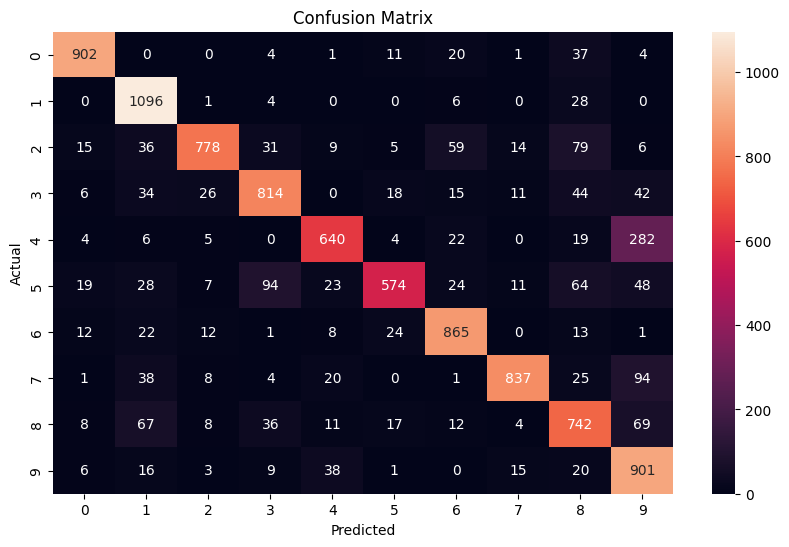

In [87]:
#
# plot the confusion matrix which is valuable, note code order change
# to ensure cm is defined
# 
cm = confusion_matrix(tslab, nb_pred)

#cm # X-axis Predicted vs Y-axis Actual Values

matplot.subplots(figsize=(10, 6))

sb.heatmap(cm, annot = True, fmt = 'g')

matplot.xlabel("Predicted")
matplot.ylabel("Actual")
matplot.title("Confusion Matrix")
matplot.show()

In [88]:
#
# NB Accuracy is only at 81.5% in this hand coded example
#

print("Test Accuracy:", round((sum(np.diagonal(cm)) / len(nb_pred)) * 100, 4), '%')

Test Accuracy: 81.49 %


In [89]:
error_rate(cm)

,% Error rate
0,7.959184
1,3.436123
2,24.612403
3,19.405941
4,34.826884
5,35.650224
6,9.707724
7,18.579767
8,23.819302
9,10.703667


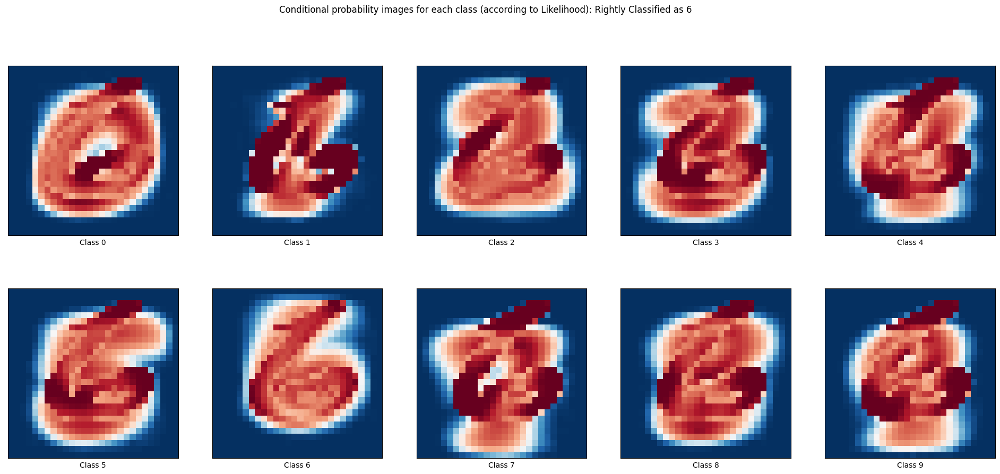

In [90]:
# 
# Here we see the probablity mapped images for each class for a 
# particular test instance which was correctly classified
# 

likeli = nb[1]
likli = likeli[9999]

matplot.subplots(2,5, figsize=(24,10))

for i in range(10):
    l1 = matplot.subplot(2, 5, i + 1)
    l1.imshow(likli[i].reshape(28, 28), interpolation='nearest',cmap=matplot.cm.RdBu)
    l1.set_xticks(())
    l1.set_yticks(())
    l1.set_xlabel('Class %i' % i)

matplot.suptitle('Conditional probability images for each class (according to Likelihood): Rightly Classified as 6')
matplot.show()

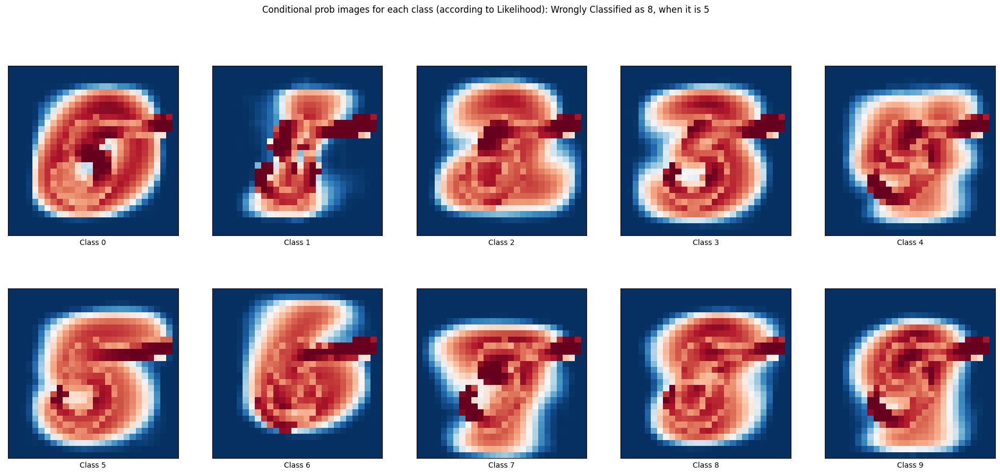

In [91]:
# 
# Here we see the probablity mapped images for each class for a 
# particular test instance which was incorrectly classified
#

likli = likeli[9998]

matplot.subplots(2,5, figsize=(24,10))

for i in range(10):
    l1 = matplot.subplot(2, 5, i + 1)
    l1.imshow(likli[i].reshape(28, 28), interpolation='nearest',cmap=matplot.cm.RdBu)
    l1.set_xticks(())
    l1.set_yticks(())
    l1.set_xlabel('Class %i' % i)

matplot.suptitle('Conditional prob images for each class (according to Likelihood): Wrongly Classified as 8, when it is 5')
matplot.show()

##### *Multinomial Naive Bayes Classfier using sklearn.naive_bayes.MultinomialNB()*

Code (and some explanatory text) sourced from scikit_learn docs available at
https://docs.w3cub.com/scikit_learn/modules/generated/sklearn.naive_bayes.multinomialnb

*NB: Naive Bayes classifier for multinomial models*

The multinomial Naive Bayes classifier is suitable for classification with 
discrete features (e.g., word counts for text classification). The multinomial 
distribution normally requires integer feature counts. However, in practice, 
fractional counts such as tf-idf may also work.

In [ ]:
import numpy as np

X = np.random.randint(5, size=(6, 100))
y = np.array([1, 2, 3, 4, 5, 6])

from sklearn.naive_bayes import MultinomialNB

clf = MultinomialNB()
clf.fit(X, y)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

MultinomialNB()

In [ ]:
print(clf.predict(X[2:3]))

[3]


In [ ]:
#
# convert using MNIST data
#

X = X_training
y = y_train

clf = MultinomialNB()
clf.fit(X, y)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)


MultinomialNB()

In [ ]:
predictions = clf.predict(X_validation)

print(predictions)

[7 2 1 ... 9 8 6]


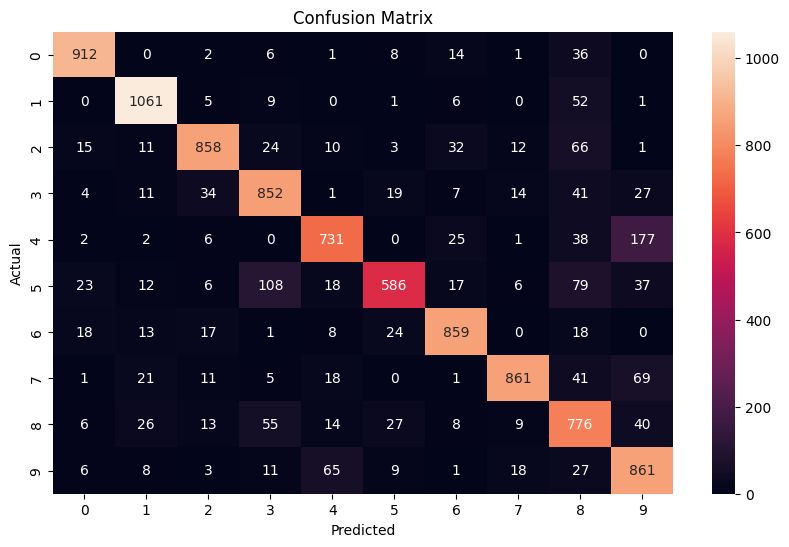

In [ ]:
#
# plot the Confusion Matrix using actuals (y_valid)
# and predicted values (predictsions)
# 
# X-axis Predicted vs Y-axis Actual Values
#
cm = confusion_matrix(y_valid, predictions)

matplot.subplots(figsize=(10, 6))

sb.heatmap(cm, annot = True, fmt = 'g')

matplot.xlabel("Predicted")
matplot.ylabel("Actual")
matplot.title("Confusion Matrix")
matplot.show()

In [ ]:
#
# NB: Here is our 83.5% accuracy rate
#
clf.score(X_validation, y_valid)

0.8357

### 2.3 Your turn! (10 points) - *RandomForestClassfier()*

Write code to: 

1. Build and fit a 10-class Random Forests classifier using scikit-learn's `RandomForestClassifier()` with default options (don't forget `random_state=0`) and using the raw pixel values as features. 
2. Make predictions on the test data, compute the overall accuracy and plot the resulting confusing matrix. 

Hint: your accuracy should be > 90%

#####*What is a Random Forest Classifier?*

Text from https://towardsdatascience.com/a-practical-guide-to-implementing-a-random-forest-classifier-in-python-979988d8a263

*Random forest is a supervised learning method, meaning there are labels for and mappings between our input and outputs. It can be used for classification tasks like determining the species of a flower based on measurements like petal length and color, or it can used for regression tasks like predicting tomorrow’s weather forecast based on historical weather data. A random forest—as the name suggests—consists of multiple decision trees each of which outputs a prediction. When performing a classification task, each decision tree in the random forest votes for one of the classes to which the input belongs. For example, if we had a dataset on flowers and we wanted to determine the species of a flower, the decision trees in a random forest will each cast a vote for which species it thinks a flower belongs. Once all the trees have come to a conclusion, the random forest will count which class (species) had the most populous vote and this class will be what the random forest outputs as a prediction. In the case of regression, instead of determining the most populous vote the random forest will average the results of each decision tree. Because random forests utilize the results of multiple learners (decisions trees), random forests are a type of ensemble machine learning algorithm. Ensemble learning methods reduce variance and improve performance over their constituent learning models.*


**Decision Trees**

*As mentioned above, random forests consists of multiple decision trees. Decision trees split data into small groups of data based on the features of the data. For example in the flower dataset, the features would be petal length and color. The decision trees will continue to split the data into groups until a small set of data under one label ( a classification ) exist. A concrete example would be choosing a place to eat. One might peruse Yelp and find a place to eat based on key decisions like: is the place open right now, how popular is this place, what is the average rating for this place, and do I need a reservation. If the place is open, then the decision tree will continue on to the next feature if not the decision ends and the model outputs “no don’t eat here”. Now at the following feature, the model will determine if a place is popular, if the location is popular the model will move on to the next feature if not the model will output “no don’t eat here”—same procedure as before. Essentially one can think of a decision tree as a flowchart mapping out decisions once can take based on data until a final conclusion is made. The decision tree determines where to split the features based on a purity measure that measures information gain. In the case of classification it makes that decision based on the Gini index or entropy and in the case of regression, the residual sum of squares. However, the mathematics of this is beyond the scope of this blog post. In essence what these metics measure is Information Gain, the measure of how much information we’re able to gather from a piece of data.*


**Random Forest Logic**

*The random forest algorithm can be described as follows:*

1. Say the number of observations is N. These N observations will be sampled at random with replacement.
2. Say there are M features or input variables. A number m, where m < M, will be selected at random at each node from the total number of features, M. The best split on these m variables are used to split the node and this value remains constant as the forest grows.
3. Each decision tree in the forest is grown to its largest extent.
4. The forest will output a prediction based on the aggregated predictions of the trees in the forest. (Either majority vote or average)

##### *sklearn.ensemble.RandomForestClassfier code and analysis*

NB code sampled from blog post "Random Forest Classifier Python Example" by Kumar, Ajitest March 2022, available at 
https://vitalflux.com/random-forest-classifier-python-code-example/#:~:text=For%20example%2C%20given%20a%20set,random%20subset%20of%20the%20data. 

[That code uses Iris Data Set, we convert to use MNIST data set.]


In [ ]:
# imports
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.model_selection import train_test_split
from mlxtend.plotting import plot_decision_regions
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier

In [ ]:
#
# Create an instance of Random Forest Classifier
#
forest = RandomForestClassifier(criterion='gini',
                                 n_estimators=5,
                                 random_state=0,    # as instructed
                                 n_jobs=2)
#
# Fit the model
#
forest.fit(X_training, y_train)

RandomForestClassifier(n_estimators=5, n_jobs=2, random_state=0)

In [ ]:
#
# Measure model performance, accuracy as expected
#
y_pred = forest.predict(X_validation)
print('Accuracy: %.3f' % accuracy_score(y_valid, y_pred))

Accuracy: 0.922


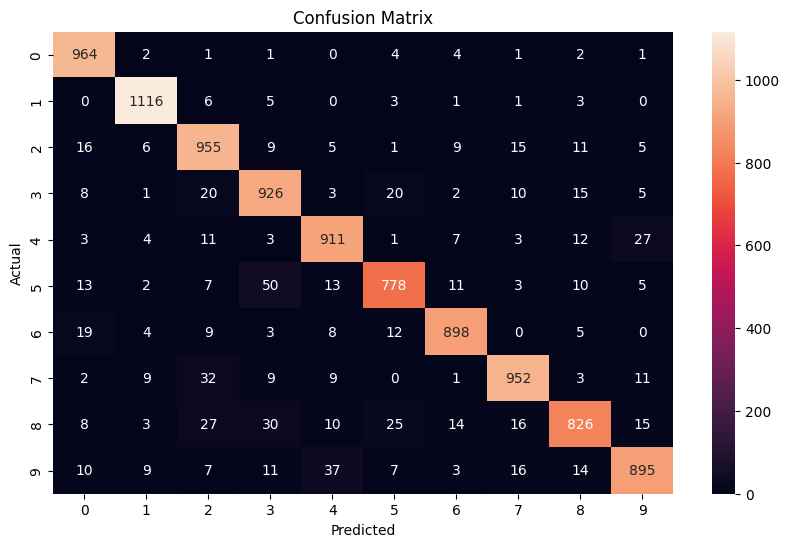

In [ ]:
#
# plot the Confusion Matrix using actuals (y_valid)
# and predicted values (predictsions)
# 
# X-axis Predicted vs Y-axis Actual Values
#
cm = confusion_matrix(y_valid, y_pred)

matplot.subplots(figsize=(10, 6))

sb.heatmap(cm, annot = True, fmt = 'g')

matplot.xlabel("Predicted")
matplot.ylabel("Actual")
matplot.title("Confusion Matrix")
matplot.show()

### 2.4 Your turn! (10 points) *- Support Vector Machine (SVM) Classfier*

Write code to: 

1. Build and fit a 10-class classifier of your choice, with sensible initialization options, and using the raw pixel values as features. 
2. Make predictions on the test data, compute the overall accuracy and plot the resulting confusing matrix. 

Hint: A variation of the Random Forests classifier from 2.2 above is acceptable. In that case, document your selection of (hyper)parameters and your rationale for choosing them.

#####*Sources*

Sanghvi, Kavish (2020) Image Classficiation Techniques by Sanghvi, Kavish May 2020 (https://medium.com/analytics-vidhya/image-classification-techniques-83fd87011cac)

Ray, Sunil (2017) Understanding Support Vector Machine(SVM) algorithm from examples (along with code), Ray, Sunil Sep 2017 (https://www.analyticsvidhya.com/blog/2017/09/understaing-support-vector-machine-example-code/)

Worth, P. and Pande, S. (2022) Idealogical Reference Architecture (IRA): An Epistemological Interpretation of Quantum Mechanics1. Open Journal of Philosophy, 12, 266-305. doi: 10.4236/ojpp.2022.123018. (https://scirp.org/journal/paperinformation.aspx?paperid=117800)

VenderPlas, Jake (2016) Python Data Science Handbook. Chapter 'In-Depth: Support Vector Machines'. (https://jakevdp.github.io/PythonDataScienceHandbook/05.07-support-vector-machines.html)

#####*SVM Architecture Overview*


**Intro**

Some of the best image classifier architectures are built on Support Vector Machines, or SVMs (Sanghvi 2020).

 
[text below from Ray 2017]

**What is the Support Vector Machine?**

*“Support Vector Machine” (SVM) is a supervised machine learning algorithm that can be used for both classification or regression challenges. However,  it is mostly used in classification problems. In the SVM algorithm, we plot each data item as a point in n-dimensional space (where n is a number of features you have) with the value of each feature being the value of a particular coordinate. Then, we perform classification by finding the hyper-plane that differentiates the two classes very well (look at the below snapshot).*

![picture](https://drive.google.com/uc?export=view&id=1Cn48_ccKCT65A9-yp5w3WNlNNoi6yA7m)

*Support Vectors are simply the coordinates of individual observation. The SVM classifier is a frontier that best segregates the two classes (hyper-plane/ line).*

PJW Notes: Multi-dimensional linear regression of sorts (planar regression) and has some affinity to Hilbert spaces, geometry used in the more canonical variant of quantum mechanics that we adopt for our Idealogical Referenace Architecture (IRA) that we put forward in our model of Idealogical Mechanics (Valdez, Pande 2022).

Sanghvi, Kavish (2020) Image Classficiation Techniques by Sanghvi, Kavish May 2020 (https://medium.com/analytics-vidhya/image-classification-techniques-83fd87011cac)

Ray, Sunil (2017) Understanding Support Vector Machine(SVM) algorithm from examples (along with code), Ray, Sunil Sep 2017 (https://www.analyticsvidhya.com/blog/2017/09/understaing-support-vector-machine-example-code/)

Worth, P. and Pande, S. (2022) Idealogical Reference Architecture (IRA): An Epistemological Interpretation of Quantum Mechanics1. Open Journal of Philosophy, 12, 266-305. doi: 10.4236/ojpp.2022.123018. (https://scirp.org/journal/paperinformation.aspx?paperid=117800)

VenderPlas, Jake (2016) Python Data Science Handbook. Chapter 'In-Depth: Support Vector Machines'. (https://jakevdp.github.io/PythonDataScienceHandbook/05.07-support-vector-machines.html)

#####*SVM (hyper) Parameter Tuning*

[Text from https://www.analyticsvidhya.com/blog/2017/09/understaing-support-vector-machine-example-code/]


Tuning the parameters’ values for machine learning algorithms effectively improves model performance. Let’s look at the list of parameters available with SVM.


*sklearn.svm.SVC(
  C=1.0, 
  kernel='rbf', 
  degree=3, 
  gamma=0.0, 
  coef0=0.0, 
  shrinking=True, 
  probability=False,tol=0.001, 
  cache_size=200, 
  class_weight=None, 
  verbose=False, 
  max_iter=-1, 
  random_state=None
) *


**kernel**: We have already discussed about it. Here, we have various options available with kernel like, “linear”, “rbf”,”poly” and others (default value is “rbf”)... I would suggest you go for linear SVM kernel if you have a large number of features (>1000) because it is more likely that the data is linearly separable in high dimensional space. Also, you can use RBF but do not forget to cross-validate for its parameters to avoid over-fitting.

**gamma**: Kernel coefficient for ‘rbf’, ‘poly’ and ‘sigmoid’. Higher the value of gamma, will try to exact fit the as per training data set i.e. generalization error and cause over-fitting problem.

**C**: Penalty parameter C of the error term. It also controls the trade-off between smooth decision boundaries and classifying the training points correctly.


**Pros and Cons associated with SVM**

*Pros*:

It works really well with a clear margin of separation

It is effective in high dimensional spaces.

It is effective in cases where the number of dimensions is greater than the number of samples.

It uses a subset of training points in the decision function (called support vectors), so it is also memory efficient.

*Cons*:

It doesn’t perform well when we have large data set because the required training time is higher

It also doesn’t perform very well, when the data set has more noise i.e. target classes are overlapping

SVM doesn’t directly provide probability estimates, these are calculated using an expensive five-fold cross-validation. It is included in the related SVC method of Python scikit-learn library.

#####*SVM Classfier Code*

Parts of code sourced from Ray, S (2017) (https://www.analyticsvidhya.com/blog/2017/09/understaing-support-vector-machine-example-code/).

Confusion Matrix code from VanderPlas 2016 (https://jakevdp.github.io/PythonDataScienceHandbook/05.07-support-vector-machines.html).

*NB: The building of the model and fitting is most certainly expensive, the first section of code here takes several minutes to run, even under GPU runtime. Known characteristic of these models apparently given the calculations involved.*

In [ ]:
#Import libraries
from sklearn import svm
import pandas as pd
from sklearn.metrics import accuracy_score

import matplotlib.pyplot as plt
import numpy as np

# From Variable definitions above:
# the data, split between train and validation sets
# (X_train, y_train), (X_valid, y_valid) = mnist.load_data()

C = 1.0 # SVM regularization parameter
svc = svm.SVC(kernel='rbf', C=1).fit(X_training, y_train)

In [ ]:
predicted= svc.predict(X_validation)

In [ ]:
score=accuracy_score(y_valid,predicted)

print("Your Model Accuracy is", score)

Your Model Accuracy is 0.9792


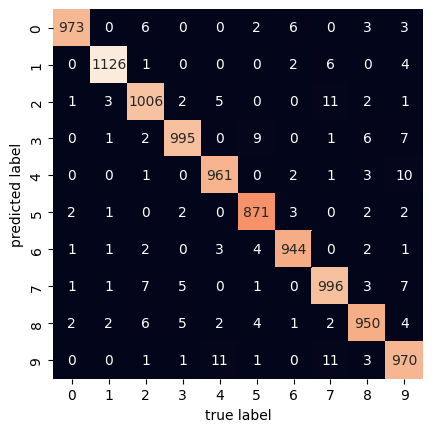

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

mat = confusion_matrix(y_valid, predicted)

sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False)

plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_valid, predicted))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       980
           1       0.99      0.99      0.99      1135
           2       0.98      0.97      0.98      1032
           3       0.97      0.99      0.98      1010
           4       0.98      0.98      0.98       982
           5       0.99      0.98      0.98       892
           6       0.99      0.99      0.99       958
           7       0.98      0.97      0.97      1028
           8       0.97      0.98      0.97       974
           9       0.97      0.96      0.97      1009

    accuracy                           0.98     10000
   macro avg       0.98      0.98      0.98     10000
weighted avg       0.98      0.98      0.98     10000



## Part 3: Face Recognition using PCA (eigenfaces)

In this part you will build a face recognition solution.

We will use a subset of the Labeled Faces in the Wild (LFW) people dataset: https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_lfw_people.html

The Python code below loads a dataset of 1867 images (resized to 62 $\times$ 47 pixels) from the dataset and displays some of them.

In [3]:
from sklearn.datasets import fetch_lfw_people
faces = fetch_lfw_people(min_faces_per_person=40)
print(faces.target_names)
print(faces.images.shape)

['Ariel Sharon' 'Arnold Schwarzenegger' 'Colin Powell' 'Donald Rumsfeld'
 'George W Bush' 'Gerhard Schroeder' 'Gloria Macapagal Arroyo'
 'Hugo Chavez' 'Jacques Chirac' 'Jean Chretien' 'Jennifer Capriati'
 'John Ashcroft' 'Junichiro Koizumi' 'Laura Bush' 'Lleyton Hewitt'
 'Luiz Inacio Lula da Silva' 'Serena Williams' 'Tony Blair'
 'Vladimir Putin']
(1867, 62, 47)


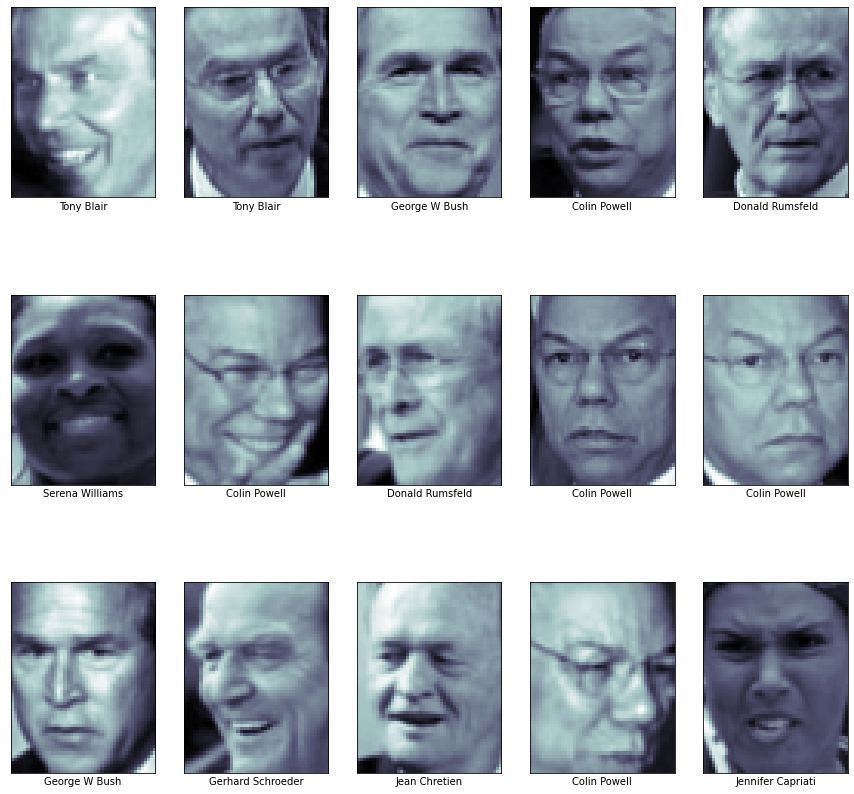

In [4]:
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

plt.rcParams["figure.figsize"]=15,15
fig, ax = plt.subplots(3, 5)
for i, axi in enumerate(ax.flat):
    axi.imshow(faces.images[i], cmap='bone')
    axi.set(xticks=[], yticks=[],
            xlabel=faces.target_names[faces.target[i]])

#### 3.1 Your turn! (15 points)

Write code to: 

1. Use Principal Component Analysis (PCA) to reduce the dimensionality of each face to the first 120 components. 
2. Build and fit a multi-class SVM classifier, with sensible initialization options, and using the PCA-reduced  features. 
3. Make predictions on the test data, compute the precision, recall and f1 score for each category, compute the overall accuracy, and plot the resulting confusing matrix. 
4. Display examples of correct and incorrect predictions (at least 5 of each). 

#####*Train and Plot Data*

In [5]:
from sklearn.model_selection import train_test_split

Xtrain, Xtest, ytrain, ytest = train_test_split(faces.data, faces.target, stratify = faces.target, test_size = 0.25, random_state = 0)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


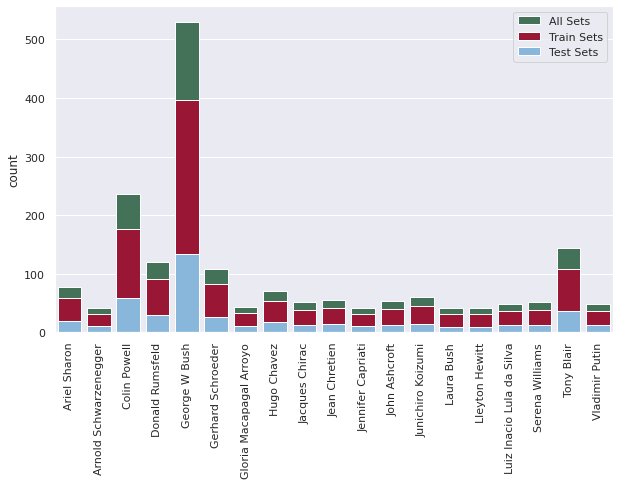

In [6]:
import seaborn as sns; sns.set()

plt.figure(figsize = (10, 6))

sns.countplot(faces.target, label = 'All Sets', palette = ['#3B7A57'])
sns.countplot(ytrain, label = 'Train Sets', palette = ['#AF002A'])
sns.countplot(ytest, label = 'Test Sets', palette = ['#7CB9E8'])

plt.xticks(range(len(faces.target_names)), faces.target_names, rotation = 'vertical')
plt.legend()

plt.show()

#####*C-Support Vector Classification with PCA*

In [7]:
from sklearn.decomposition import PCA

number_of_components = 120
pca = PCA(n_components = number_of_components, whiten = True, random_state = 0)

In [8]:
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV

svc = SVC(kernel = 'rbf', class_weight = 'balanced', random_state = 0)
model = make_pipeline(pca, svc)

param_grid = {'svc__C': [1, 5, 10, 50], 'svc__gamma': [0.0001, 0.0005, 0.001, 0.005, 0.01]}

In [9]:
grid = GridSearchCV(model, param_grid, cv = 3, n_jobs = -1, verbose = 2)
grid.fit(Xtrain, ytrain);

Fitting 3 folds for each of 20 candidates, totalling 60 fits


In [11]:
print(grid.best_params_)

{'svc__C': 5, 'svc__gamma': 0.005}


#####*Predictions and Metrics*

In [12]:
svc_classifier = grid.best_estimator_
predict_test_data = svc_classifier.predict(Xtest)

In [13]:
from sklearn.metrics import accuracy_score

print((accuracy_score(ytest, predict_test_data)))

0.7987152034261242


In [14]:
from sklearn.metrics import classification_report

print(classification_report(ytest, predict_test_data, target_names = faces.target_names))

                           precision    recall  f1-score   support

             Ariel Sharon       0.74      0.74      0.74        19
    Arnold Schwarzenegger       0.50      0.18      0.27        11
             Colin Powell       0.81      0.80      0.80        59
          Donald Rumsfeld       0.70      0.87      0.78        30
            George W Bush       0.77      0.89      0.83       133
        Gerhard Schroeder       0.89      0.93      0.91        27
  Gloria Macapagal Arroyo       1.00      1.00      1.00        11
              Hugo Chavez       0.89      0.89      0.89        18
           Jacques Chirac       0.75      0.69      0.72        13
            Jean Chretien       1.00      0.36      0.53        14
        Jennifer Capriati       0.83      0.45      0.59        11
            John Ashcroft       0.71      0.77      0.74        13
        Junichiro Koizumi       1.00      0.87      0.93        15
               Laura Bush       1.00      0.60      0.75     

#####*Confusion Matrix Plot*

In [95]:
def resulting_confusion_matrix(predict_test_data):

    #
    # this code zeros out the correct predicted values
    #
    #resulting_con_matrix = confusion_matrix(ytest, predict_test_data)
    #np.fill_diagonal(resulting_con_matrix, 0)

    resulting_matrix = confusion_matrix(ytest, predict_test_data)

    plt.figure(figsize = (8, 6))
    ax = sns.heatmap(resulting_matrix, annot = True, fmt = 'd', cbar = False, cmap = 'Blues', xticklabels = faces.target_names, yticklabels = faces.target_names)
    plt.xlabel('Prediction')
    plt.ylabel('Real')
    
    plt.show()

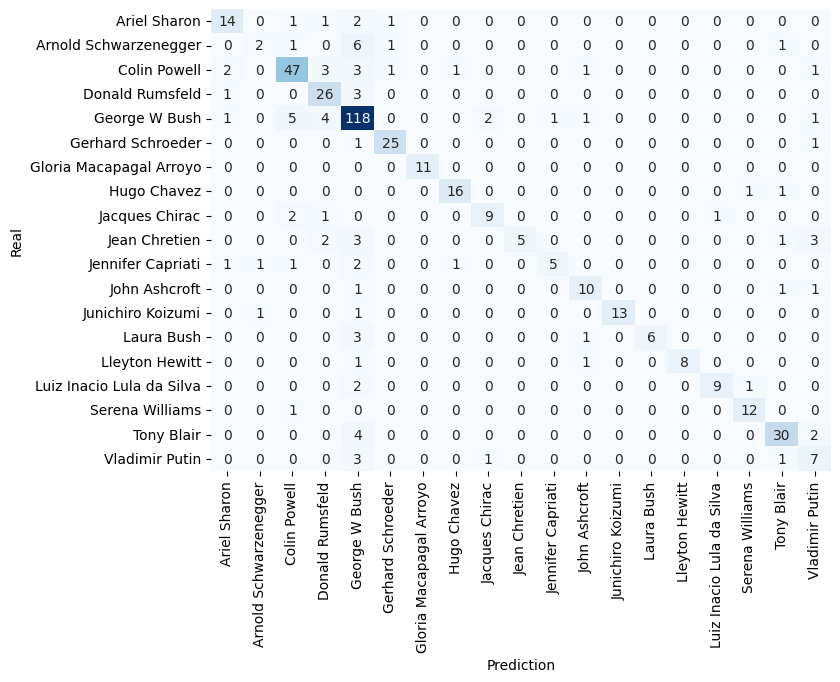

In [94]:
from sklearn.metrics import confusion_matrix
import numpy as np

resulting_confusion_matrix(predict_test_data)

#####*Correct and incorrect prediction samples*

In [20]:
def face_display(show_faces, show_labels, face_numbers, show_name = True):

    fig, ax = plt.subplots(1, face_numbers, figsize=(face_numbers, 1.5), squeeze = False)

    for i, axes in enumerate(ax.flat):
        axes.imshow(show_faces[i].reshape(62, 47), cmap = 'bone')
        axes.set(xticks=[], yticks=[])
        
        if show_name:
            axes.set_xlabel(faces.target_names[show_labels[i]].split()[-1][:10])
    
    plt.show()


-----------------------------------------------------
...Ariel Sharon metrics...

Correct Predictions:
[faces to show:  10 ; total faces found:  14 ]


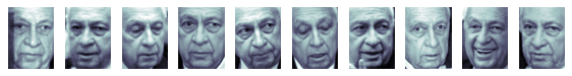


False Negatives:
[faces to show:  5 ; total faces found:  5 ]


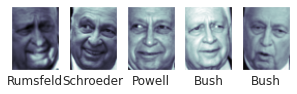


False Positives:
[faces to show:  5 ; total faces found:  5 ]


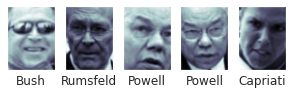


-----------------------------------------------------
...Arnold Schwarzenegger metrics...

Correct Predictions:
[faces to show:  2 ; total faces found:  2 ]


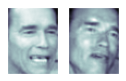


False Negatives:
[faces to show:  9 ; total faces found:  9 ]


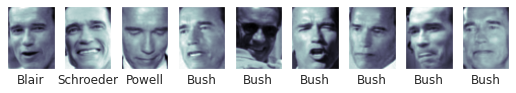


False Positives:
[faces to show:  2 ; total faces found:  2 ]


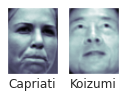


-----------------------------------------------------
...Colin Powell metrics...

Correct Predictions:
[faces to show:  10 ; total faces found:  47 ]


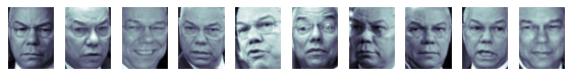


False Negatives:
[faces to show:  10 ; total faces found:  12 ]


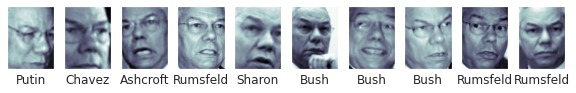


False Positives:
[faces to show:  10 ; total faces found:  11 ]


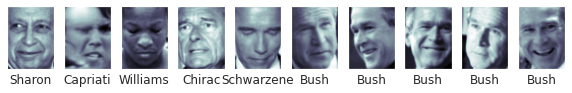


-----------------------------------------------------
...Donald Rumsfeld metrics...

Correct Predictions:
[faces to show:  10 ; total faces found:  26 ]


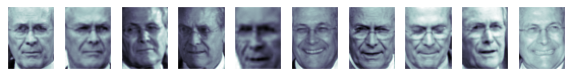


False Negatives:
[faces to show:  4 ; total faces found:  4 ]


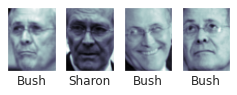


False Positives:
[faces to show:  10 ; total faces found:  11 ]


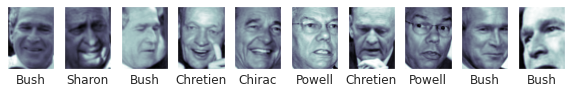


-----------------------------------------------------
...George W Bush metrics...

Correct Predictions:
[faces to show:  10 ; total faces found:  118 ]


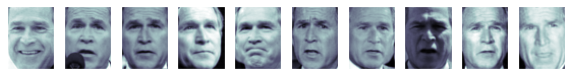


False Negatives:
[faces to show:  10 ; total faces found:  15 ]


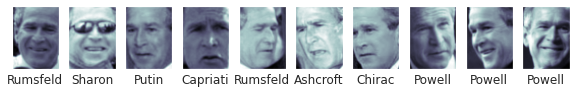


False Positives:
[faces to show:  10 ; total faces found:  35 ]


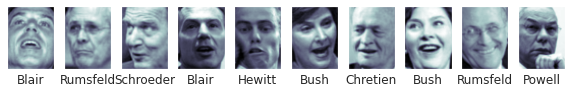


-----------------------------------------------------
...Gerhard Schroeder metrics...

Correct Predictions:
[faces to show:  10 ; total faces found:  25 ]


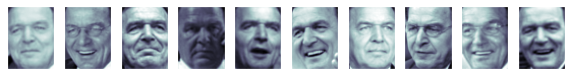


False Negatives:
[faces to show:  2 ; total faces found:  2 ]


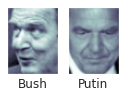


False Positives:
[faces to show:  3 ; total faces found:  3 ]


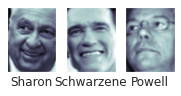


-----------------------------------------------------
...Gloria Macapagal Arroyo metrics...

Correct Predictions:
[faces to show:  10 ; total faces found:  11 ]


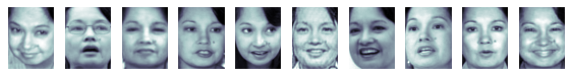


False Negatives:
[faces to show:  0 ; total faces found:  0 ]

False Positives:
[faces to show:  0 ; total faces found:  0 ]

-----------------------------------------------------
...Hugo Chavez metrics...

Correct Predictions:
[faces to show:  10 ; total faces found:  16 ]


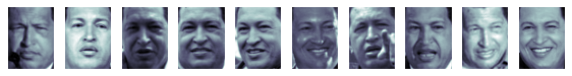


False Negatives:
[faces to show:  2 ; total faces found:  2 ]


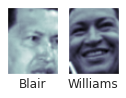


False Positives:
[faces to show:  2 ; total faces found:  2 ]


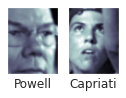


-----------------------------------------------------
...Jacques Chirac metrics...

Correct Predictions:
[faces to show:  9 ; total faces found:  9 ]


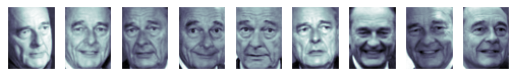


False Negatives:
[faces to show:  4 ; total faces found:  4 ]


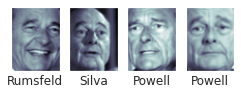


False Positives:
[faces to show:  3 ; total faces found:  3 ]


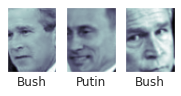


-----------------------------------------------------
...Jean Chretien metrics...

Correct Predictions:
[faces to show:  5 ; total faces found:  5 ]


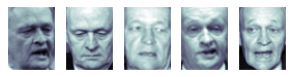


False Negatives:
[faces to show:  9 ; total faces found:  9 ]


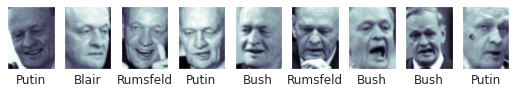


False Positives:
[faces to show:  0 ; total faces found:  0 ]

-----------------------------------------------------
...Jennifer Capriati metrics...

Correct Predictions:
[faces to show:  5 ; total faces found:  5 ]


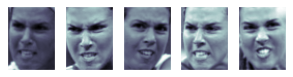


False Negatives:
[faces to show:  6 ; total faces found:  6 ]


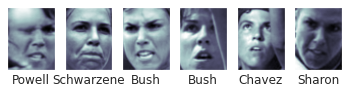


False Positives:
[faces to show:  1 ; total faces found:  1 ]


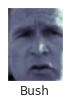


-----------------------------------------------------
...John Ashcroft metrics...

Correct Predictions:
[faces to show:  10 ; total faces found:  10 ]


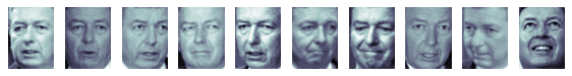


False Negatives:
[faces to show:  3 ; total faces found:  3 ]


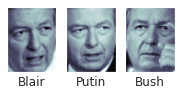


False Positives:
[faces to show:  4 ; total faces found:  4 ]


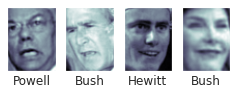


-----------------------------------------------------
...Junichiro Koizumi metrics...

Correct Predictions:
[faces to show:  10 ; total faces found:  13 ]


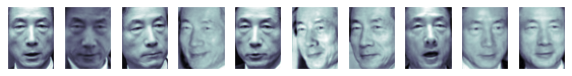


False Negatives:
[faces to show:  2 ; total faces found:  2 ]


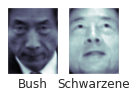


False Positives:
[faces to show:  0 ; total faces found:  0 ]

-----------------------------------------------------
...Laura Bush metrics...

Correct Predictions:
[faces to show:  6 ; total faces found:  6 ]


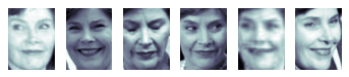


False Negatives:
[faces to show:  4 ; total faces found:  4 ]


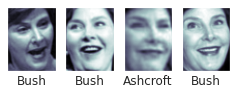


False Positives:
[faces to show:  0 ; total faces found:  0 ]

-----------------------------------------------------
...Lleyton Hewitt metrics...

Correct Predictions:
[faces to show:  8 ; total faces found:  8 ]


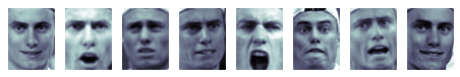


False Negatives:
[faces to show:  2 ; total faces found:  2 ]


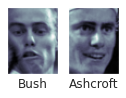


False Positives:
[faces to show:  0 ; total faces found:  0 ]

-----------------------------------------------------
...Luiz Inacio Lula da Silva metrics...

Correct Predictions:
[faces to show:  9 ; total faces found:  9 ]


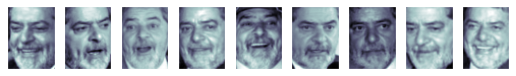


False Negatives:
[faces to show:  3 ; total faces found:  3 ]


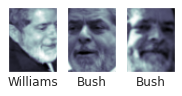


False Positives:
[faces to show:  1 ; total faces found:  1 ]


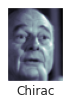


-----------------------------------------------------
...Serena Williams metrics...

Correct Predictions:
[faces to show:  10 ; total faces found:  12 ]


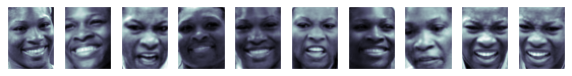


False Negatives:
[faces to show:  1 ; total faces found:  1 ]


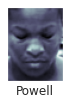


False Positives:
[faces to show:  2 ; total faces found:  2 ]


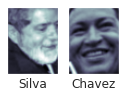


-----------------------------------------------------
...Tony Blair metrics...

Correct Predictions:
[faces to show:  10 ; total faces found:  30 ]


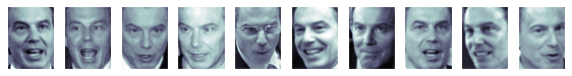


False Negatives:
[faces to show:  6 ; total faces found:  6 ]


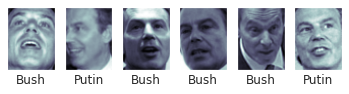


False Positives:
[faces to show:  5 ; total faces found:  5 ]


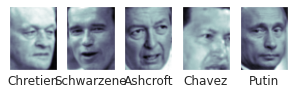


-----------------------------------------------------
...Vladimir Putin metrics...

Correct Predictions:
[faces to show:  7 ; total faces found:  7 ]


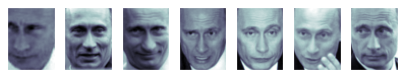


False Negatives:
[faces to show:  5 ; total faces found:  5 ]


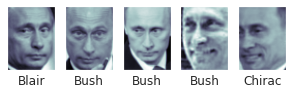


False Positives:
[faces to show:  9 ; total faces found:  9 ]


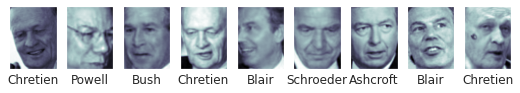


-----------------------------------------------------


In [42]:
#
# prints out Correct Predictions, False Negative Predictions, and 
# False Positive Predictions for each name in faces.target_names
# NB that it prints out max of 10 values for each category for each
# face
#

print()
print('-----------------------------------------------------')

for i, name in enumerate(faces.target_names):       # one loop for each face

  print('...' + name + ' metrics...')
  print()
  print('Correct Predictions:')          
  mask = (ytest == i) & (predict_test_data == i)
  face_total = sum(mask)                            # total corrects
  face_numbers = min(10, sum(mask))
  
  print("[faces to show: ", face_numbers, "; total faces found: ", face_total, "]")
  face_display(Xtest[mask], predict_test_data[mask], face_numbers, show_name = False)
  
  print()
  print('False Negatives:')                          # should have been positives
  mask = (ytest == i) & (predict_test_data != i)
  face_total = sum(mask)                            # total false negatives
  face_numbers = min(10, sum(mask))
  
  print("[faces to show: ", face_numbers, "; total faces found: ", face_total, "]")
  if face_numbers > 0:
        face_display(Xtest[mask], predict_test_data[mask], face_numbers)
  
  print()
  print('False Positives:')                          # should have been negatives
  mask = (ytest != i) & (predict_test_data == i)
  face_total = sum(mask)                            # total false positives
  face_numbers = min(10, sum(mask))
  
  print("[faces to show: ", face_numbers, "; total faces found: ", face_total, "]")
  if face_numbers > 0:
      face_display(Xtest[mask], ytest[mask], face_numbers)

  print()
  print('-----------------------------------------------------')

## Conclusions (10 points)

Write your conclusions and make sure to address the issues below:
- What have you learned from this assignment?
- Which parts were the most fun, time-consuming, enlightening, tedious?
- What would you do if you had an additional week to work on this?

*Machine Learning and in particular Linear Regression is a very useful and effective tool when looking at trends or correlations between different variables. For example, in Part 1a we are exploring the correlation between literacy and fertility. It is a common stereotype that women in underdeveloped countries, are less educated and more likely to become pregnant at a young age. In some underdeveloped parts of the world, it is normal/expected for women to have a lot of kids. Technological development such as coding allows us to visualize this information and gain more insight into certain topics. For instance, in this case the information collected could be used to take action in introducing basic educational tools in underdeveloped countries in order to prevent girls from becoming pregnant at a young age. You can then use and analyse the data collected in order to see whether certain interventions have had a positive/negative impact. The fact that we have access to data along with technology improving and developing every single day is extremely promising.*

*In addition, data visualization can be useful when it comes to the comparison of results. For example in 1.5, we have a graph showing prediction vs experiment lines. You can use the graph to gain a better understanding of the data and make certain interpretations which could lead to life changing innovations (of course, depending on the case at hand). It is great that you can have such things visually represented because it definitely improves your understanding and could even lead to you making very interesting and insightful conclusions.*

*One of the clear takeaways from this assignment is the scope and variety of the type of problems that Machine Learning (Deep Learning) libraries and frameworks help to 'solve'. From regression problems, to classification problems to image classification (recognitiion) problems to, what we have yet to cover, natural language processing problems. Basically a set of problems relates to data sets and the ability to predict outcomes more generally.*

*The variety of problems that are solvable, at least to some level of accuracy or acceptable predictability, in this domain are most certainly vast but with the proliferation of data these days, combined with the availability of computing resource power, the domains applicability has widended considerably and contonues to do so.*

*The variations of problems that are solvable lends itself toward various solution frameworks to facilitate these solutions, hence the various types of machine learning architectures available from DecisionTrees, RandomForests, various forms of Neural Networks, etc etc. Each of these frameworks (architectures really) has embedded within them certain mathematical principles, along with certain (hyper) parameters, that not only allow for the tuning of these various architectures for the problem at hand, but also a variety of possible frameworks (again architectures) that can be used given the problem that one is looking to solve (e.g. the SVM architecture that we explore in the last question in Part 2 for image classification specifically).*

*Each of these architectures have pros and cons that range from complexity dimensions, types of data they are good at analyzing, to performance, and there has now emerged a large body of literature that had identified, more or less, which ML architectures are best used for which types of problems - again for example the SVM architecture for image classification that we use in Part 2.*

*What's also clear after doing this assignment, along with assignments 1 and 2, is that data preparation is a huge part of what makes models 'effective', as measured by whatever metric we are using (accuracy for example) to measure 'effectiveness' for the problem at hand. Artifacts of this importance of the underlying data preparation stage for model effectiveness can be found in both the best practices related to splitting data up between validation and test data sets as well as practices for optimizing model learning with use of k fold validation techniques for example. Generally speaking, the old systems adage of garbage in garbage out applies here in this field of computer science as well.*

*Areas of interest and future research include natural language processing applicability in general but also data visualization which comes as sort of a byproduct to the tools and libraries that are used throughout - from Confusion Matrices to Charting and Histogram plotting, to regression analysis graphs and polynomial regression analysis charts... each of these visual paradigms is available in various libraries that are included with the python libraries we are using (numpy, matlib, etc). With respect to multi-dimensional analysis in general (as we see with classfication problems generally and also with the SVM architecture design) the very same python libraries we use to analyze the data as it relates to ML problems specifically, also has potential to help visualize solutions to a broader range of problems - for example visualizing the movement of quantum mechanical objects through Hibert space, a geometry that shares many characteristics with the multi-dimensional architecture of for example Support Vector Machines.*